 # Module 10 - Single Cell RNA-Seq analysis with Scanpy

 ## Introduction
Single cell analysis is a rapidly growing field in biology. The ability to analyze individual cells has allowed researchers to gain a better understanding of the heterogeneity of cells within a population.

 This module will introduce the basic concepts of single cell analysis and provide an overview of a select number of tools available for single cell analysis.

 ## Learning Objectives

 - Understand the basic steps of single cell RNA-Sequencing analysis workflows
 - Develop a baseline awareness of cellular heterogeneity both between and within
   cell 'types'.
 - Learn to identify and examine cell state transitions via pseudotime analysis
 - Understanding the application of dimensionality reduction to visualization and
   high-dimensional sequencing data analysis.


 ## Load required modules

In [163]:
!pip install scanpy scfates rpy2

In [164]:
import numpy as np
import pandas as pd
import plotnine as pn
import anndata as ad
import scanpy as sc
import scFates as scf


 ## Data
 ### Description

 The dataset we are using is a example dataset generated by the 10x Genomics company consisting of ~[10k neurons from an E18 mouse](https://support.10xgenomics.com/single-cell-gene-expression/datasets/3.0.0/neuron_10k_v3)

 Cells for this sample are from a combined cortex, hippocampus and subventricular zone of an E18 mouse.
 - 11,869 cells detected
 - Sequenced on Illumina NovaSeq with approximately 30,000 reads per cell
 - 28bp read1 (16bp Chromium barcode and 12bp UMI), 91bp read2 (transcript), and
   8bp I7 sample barcode
   
 ![10x Genomics sequencing workflow overview](https://dnacore.missouri.edu/images/10xschematic.jpg)
 
 Experimental questions:
 - What types of cells do we expect to find?
 - What/how many cellular 'states' do we observe at the transcriptional level?
 - How well defined are different cell types
   - What do 'transitioning' cell types/states look like?
 - Can we identify differentially expressed and/or marker genes between cell
   types?
 - What genes change expression over the course of neuronal development?
 ### Download dataset


In [165]:
%%bash
mkdir -p data
wget -P data/ https://cf.10xgenomics.com/samples/cell-exp/3.0.0/neuron_10k_v3/neuron_10k_v3_filtered_feature_bc_matrix.h5 


--2025-12-01 12:13:44--  https://cf.10xgenomics.com/samples/cell-exp/3.0.0/neuron_10k_v3/neuron_10k_v3_filtered_feature_bc_matrix.h5
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.0.173, 104.18.1.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.0.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 45353844 (43M) [binary/octet-stream]
Saving to: ‘data/neuron_10k_v3_filtered_feature_bc_matrix.h5.7’

     0K .......... .......... .......... .......... ..........  0% 22.3M 2s
    50K .......... .......... .......... .......... ..........  0% 23.3M 2s
   100K .......... .......... .......... .......... ..........  0% 5.30M 4s
   150K .......... .......... .......... .......... ..........  0% 28.6M 3s
   200K .......... .......... .......... .......... ..........  0% 5.24M 4s
   250K .......... .......... .......... .......... ..........  0% 43.1M 4s
   300K .......... .......... .......... .......... ..........

 ## Overview
 The data we are using *has already been preprocessed* (aligned and demultiplexed to single cell resolution) using the Cell Ranger workflow.

 The `.h5` file we just downloaded is one of the output files from the 10x Genomics Cell Ranger pipeline. This file contains the following information:

 - A sparse matrix of gene expression values
 - A list of gene names
 - A list of cell barcodes
 - A list of cell metadata (e.g. number of genes detected, number of UMIs detected, etc.)



 We will be using the [Scanpy](https://scanpy.readthedocs.io/en/stable/) package to analyze this data. Scanpy is a Python package for single-cell analysis.

 It has a number of useful functions for preprocessing, analyzing, and visualizing single cell data. It also has a number of useful functions for integrating single cell data from multiple samples.
 ## Set some scanpy defaults for feedback and logging
 Some default settings

In [166]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')


 Let's read in the datafile to create an anndata object. scanpy provides a function to directly read in 10x data from the .h5 file.

In [167]:
adata = sc.read_10x_h5('data/neuron_10k_v3_filtered_feature_bc_matrix.h5',gex_only=False)


reading data/neuron_10k_v3_filtered_feature_bc_matrix.h5
 (0:00:01)


/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 Since we're using gene names as the index, and these are not _guaranteed_ to be unique, we'll make them unique here as a first step.

In [168]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`


 Let's take a look at the contents of the anndata object we just created.

In [169]:
adata


AnnData object with n_obs × n_vars = 11843 × 31053
    var: 'gene_ids', 'feature_types', 'genome'

 To access the data matrix, variable information (genes), and observation metadata (cells), we can use the `.X`, `.var`, and `.obs` attributes of the anndata object.

 Try them below to get a feel for what they contain.

In [170]:
adata.X


<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 31522268 stored elements and shape (11843, 31053)>

 Let's start by taking a peek at some of the most highly expressed genes in these cells.

normalizing counts per cell
    finished (0:00:00)


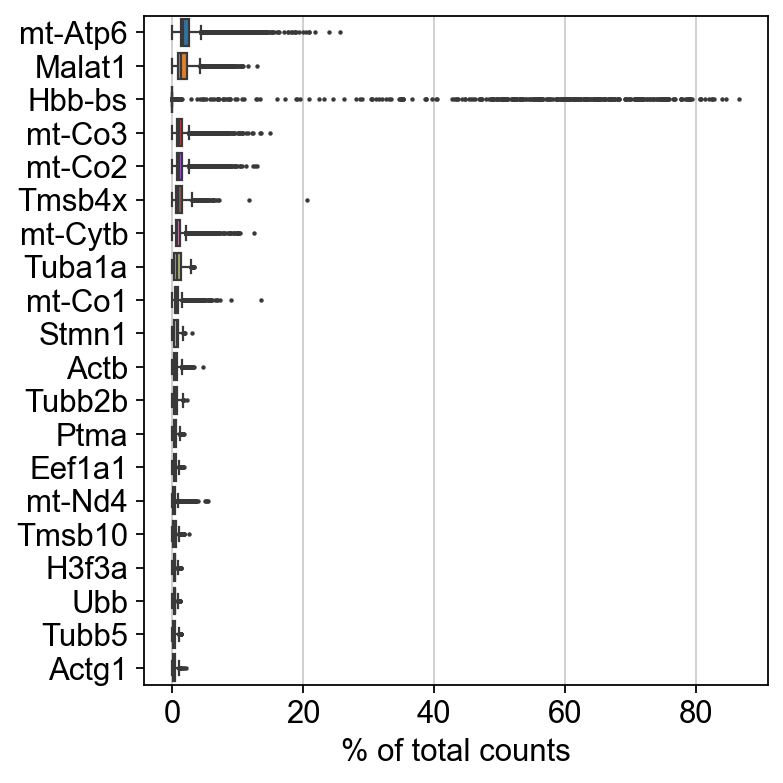

In [171]:
sc.pl.highest_expr_genes(adata, n_top=20)


What do we know about these genes?  Are they consistent with what we would expect given the tissue/cells we are analyzing?

## Basic filtering
 Here we are going to assess some basic quality control metrics and decide which cells and genes to keep for downstream analysis.

 We can start by removing cells that have a low number of genes detected and genes that are detected in a low number of cells.

 _Note: these thresholds are relatively arbitrary and should be adjusted based on the dataset and experimental design._

In [172]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)


filtered out 195 cells that have less than 200 genes expressed
filtered out 12489 genes that are detected in less than 3 cells


 Let's take a look at the data after filtering.

In [173]:
adata

AnnData object with n_obs × n_vars = 11648 × 18564
    obs: 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'

 Next, we will calculate some QC metrics for each cell and add them to the `.obs` attribute of the anndata object.

 As part of this process, we want to assess the relative abundance of mitochondrial genes in each cell, as this can be an indicator of cell health/quality.

 We can do this by calculating the percentage of counts that come from mitochondrial genes for each cell.

 To do this, we first need to identify which genes are mitochondrial genes. We can do this by looking at the gene names and identifying which ones start with `mt-`.

In [174]:
# Identify mitochondrial genes by gene name
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'

adata.var


,gene_ids,feature_types,genome,n_cells,mt
Xkr4,ENSMUSG00000051951,Gene Expression,mm10,800,False
Rp1,ENSMUSG00000025900,Gene Expression,mm10,9,False
Sox17,ENSMUSG00000025902,Gene Expression,mm10,81,False
Mrpl15,ENSMUSG00000033845,Gene Expression,mm10,6114,False
Lypla1,ENSMUSG00000025903,Gene Expression,mm10,1563,False
...,...,...,...,...,...
Gm10931,ENSMUSG00000094350,Gene Expression,mm10,4,False
AC168977.1,ENSMUSG00000079808,Gene Expression,mm10,14,False
AC149090.1,ENSMUSG00000095041,Gene Expression,mm10,3270,False
CAAA01118383.1,ENSMUSG00000063897,Gene Expression,mm10,1947,False


 Now that we have identified the mitochondrial genes, we can calculate the percentage of counts that come from mitochondrial genes for each cell, as well as the total number of counts per cell and a few other metrics.

In [175]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


 This function adds a number of columns to the `.var` and `.obs` attributes of the anndata object. Let's see what's been added.

In [176]:
adata.var


,gene_ids,feature_types,genome,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
Xkr4,ENSMUSG00000051951,Gene Expression,mm10,800,False,800,0.079670,93.131868,928.0
Rp1,ENSMUSG00000025900,Gene Expression,mm10,9,False,9,0.000944,99.922734,11.0
Sox17,ENSMUSG00000025902,Gene Expression,mm10,81,False,81,0.028417,99.304602,331.0
Mrpl15,ENSMUSG00000033845,Gene Expression,mm10,6114,False,6114,0.946343,47.510302,11023.0
Lypla1,ENSMUSG00000025903,Gene Expression,mm10,1563,False,1563,0.153760,86.581387,1791.0
...,...,...,...,...,...,...,...,...,...
Gm10931,ENSMUSG00000094350,Gene Expression,mm10,4,False,4,0.000343,99.965659,4.0
AC168977.1,ENSMUSG00000079808,Gene Expression,mm10,14,False,14,0.001202,99.879808,14.0
AC149090.1,ENSMUSG00000095041,Gene Expression,mm10,3270,False,3270,0.404962,71.926511,4717.0
CAAA01118383.1,ENSMUSG00000063897,Gene Expression,mm10,1947,False,1947,0.194626,83.284684,2267.0


In [177]:
adata.obs


,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
AAACCCAAGCAACTCT-1,784,784,1421.0,3.0,0.211119
AAACCCACACGCGGTT-1,2400,2399,5832.0,698.0,11.968451
AAACCCACAGCATACT-1,1776,1775,2977.0,362.0,12.159892
AAACCCACATACCATG-1,1934,1934,3599.0,238.0,6.612948
AAACCCAGTCGCACAC-1,3473,3473,9152.0,452.0,4.938811
...,...,...,...,...,...
TTTGTTGGTAGCTAAA-1,3439,3439,9756.0,388.0,3.977040
TTTGTTGGTATCCCAA-1,1987,1987,4231.0,485.0,11.463011
TTTGTTGGTCCGAAAG-1,1404,1404,2415.0,72.0,2.981366
TTTGTTGGTTCAACGT-1,2529,2529,6103.0,341.0,5.587416


 Let's plot a few of these metrics to see how the data look.

 Let's start by making a histogram of the total counts per cell and one of the number of genes detected per cell.

 We can do this using the `plotnine` package.

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/plotnine/stats/stat_bin.py:112: PlotnineWarning: 'stat_bin()' using 'bins = 95'. Pick better value with 'binwidth'.


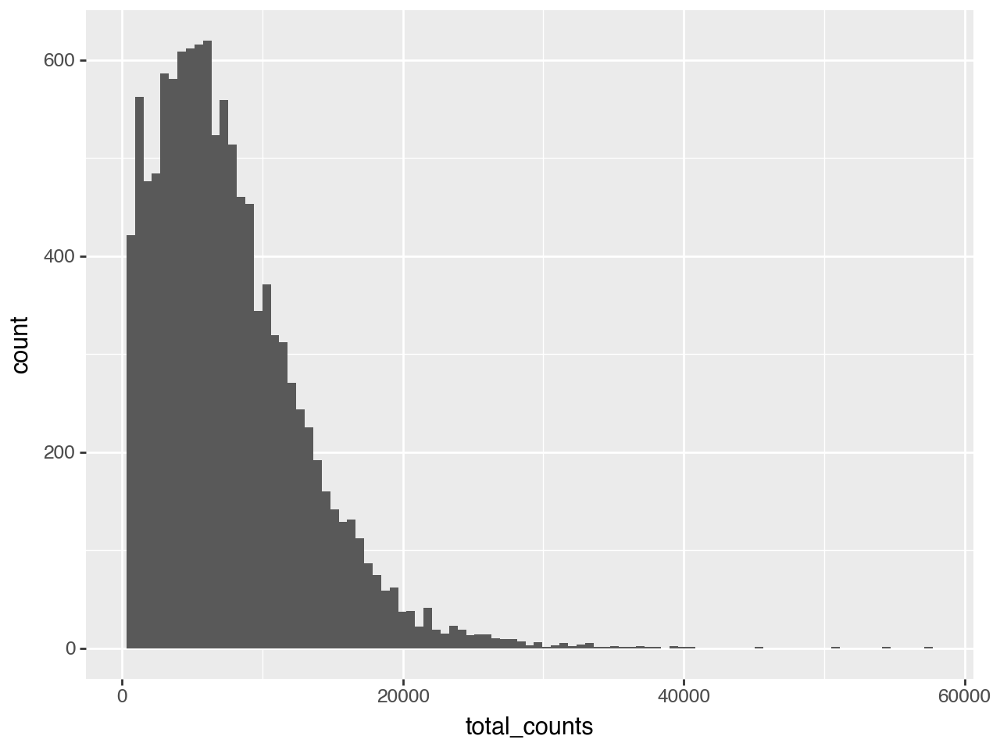

In [178]:
p = (
    pn.ggplot(adata.obs,pn.aes(x='total_counts'))
    + pn.geom_histogram()
)
p.show()


/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/plotnine/stats/stat_bin.py:112: PlotnineWarning: 'stat_bin()' using 'bins = 49'. Pick better value with 'binwidth'.


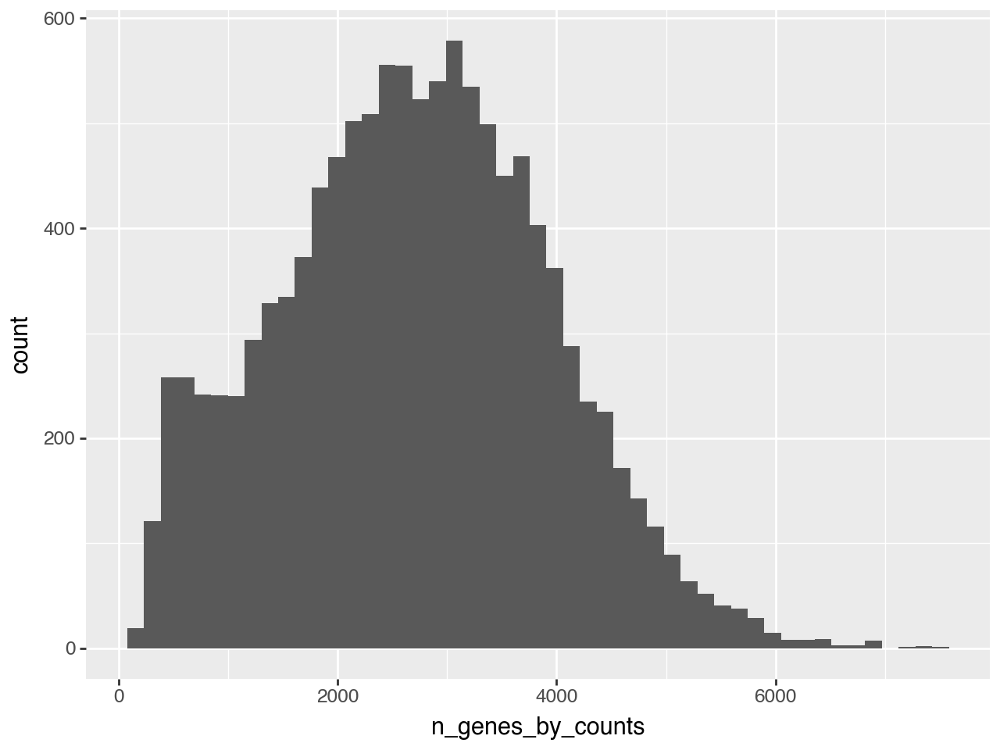

In [179]:
p = (
    pn.ggplot(adata.obs,pn.aes(x='n_genes_by_counts'))
    + pn.geom_histogram()
)
p.show()


In [180]:
adata.var

,gene_ids,feature_types,genome,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
Xkr4,ENSMUSG00000051951,Gene Expression,mm10,800,False,800,0.079670,93.131868,928.0
Rp1,ENSMUSG00000025900,Gene Expression,mm10,9,False,9,0.000944,99.922734,11.0
Sox17,ENSMUSG00000025902,Gene Expression,mm10,81,False,81,0.028417,99.304602,331.0
Mrpl15,ENSMUSG00000033845,Gene Expression,mm10,6114,False,6114,0.946343,47.510302,11023.0
Lypla1,ENSMUSG00000025903,Gene Expression,mm10,1563,False,1563,0.153760,86.581387,1791.0
...,...,...,...,...,...,...,...,...,...
Gm10931,ENSMUSG00000094350,Gene Expression,mm10,4,False,4,0.000343,99.965659,4.0
AC168977.1,ENSMUSG00000079808,Gene Expression,mm10,14,False,14,0.001202,99.879808,14.0
AC149090.1,ENSMUSG00000095041,Gene Expression,mm10,3270,False,3270,0.404962,71.926511,4717.0
CAAA01118383.1,ENSMUSG00000063897,Gene Expression,mm10,1947,False,1947,0.194626,83.284684,2267.0


 Here, `n_genes_by_counts` is the number of genes detected in each cell (normalized by the total counts in each cell).

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/plotnine/stats/stat_bin.py:112: PlotnineWarning: 'stat_bin()' using 'bins = 63'. Pick better value with 'binwidth'.


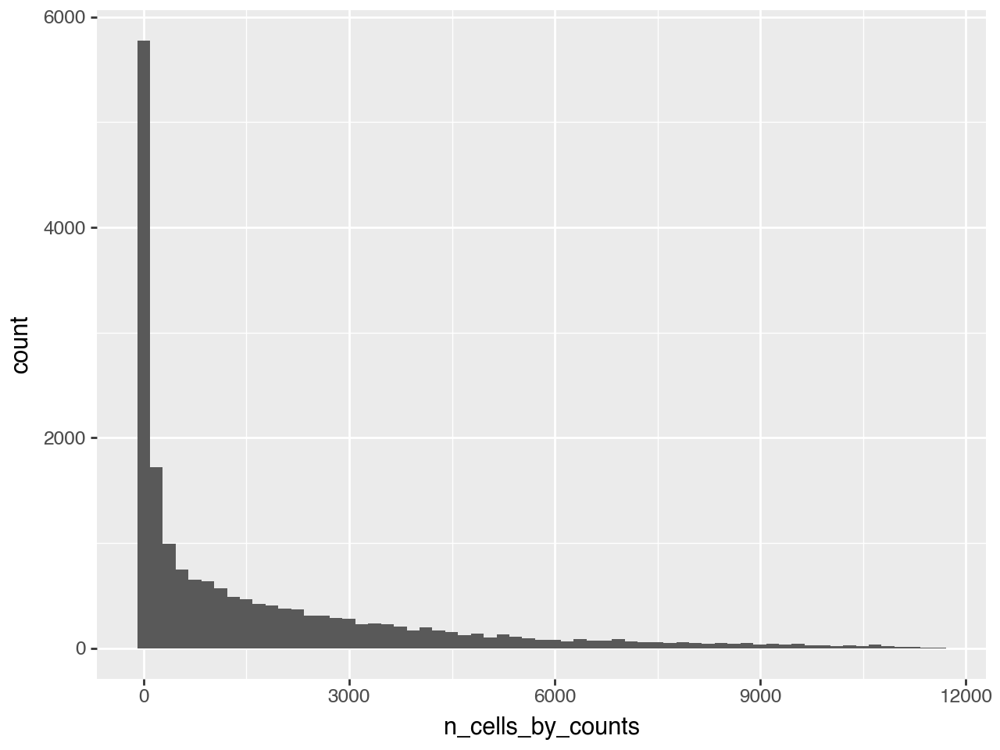

In [181]:
p = (
    pn.ggplot(adata.var,pn.aes(x='n_cells_by_counts'))
    + pn.geom_histogram()
    #+ pn.scale_x_log10()
)

p.show()

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/plotnine/stats/stat_bin.py:112: PlotnineWarning: 'stat_bin()' using 'bins = 43'. Pick better value with 'binwidth'.


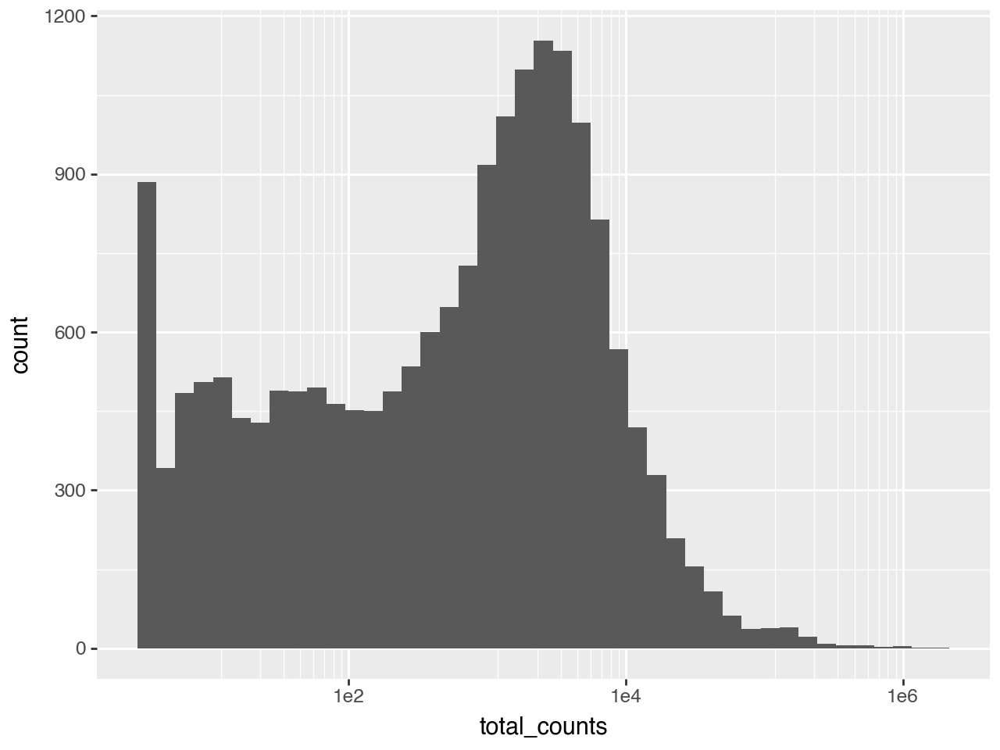

In [182]:
p = (
    pn.ggplot(adata.var,pn.aes(x='total_counts'))
    + pn.geom_histogram()
    + pn.scale_x_log10()
)

p.show()

 `scanpy` also has a number of plotting functions that can be used to visualize aspects of the anndata object as well. Please be sure to look at the scanpy api for a list of available plotting functions.

  Here, we're going to use the `sc.pl.violin` function to visualize the distribution of a few of the QC metrics we just calculated.

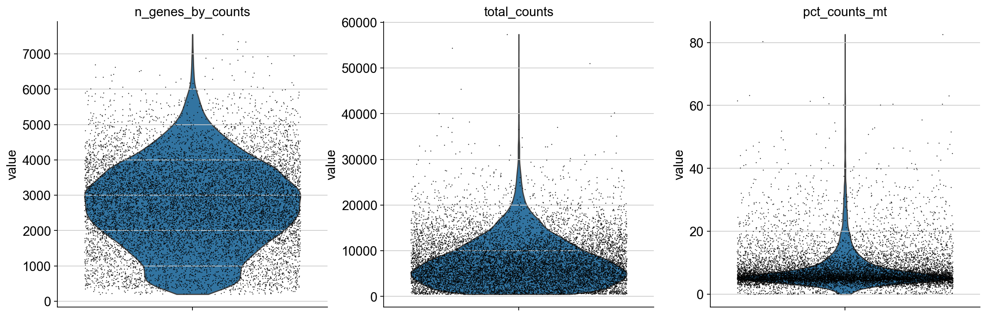

In [183]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)


 And the `sc.pl.scatter` function to visualize the relationship between the number of genes detected and the total counts for each cell.

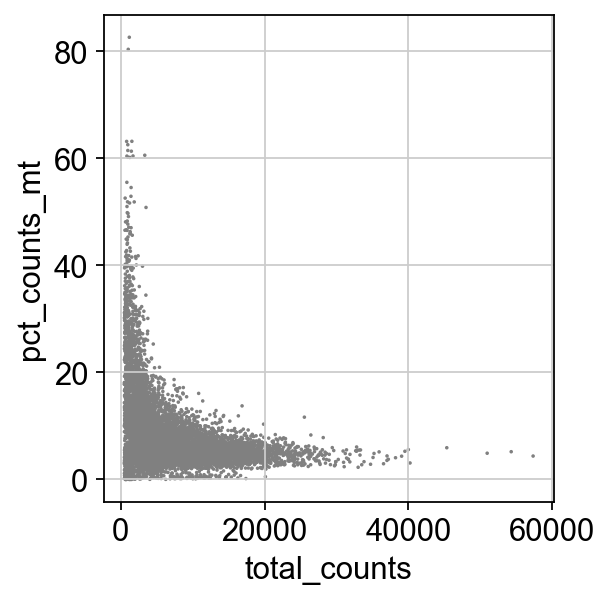

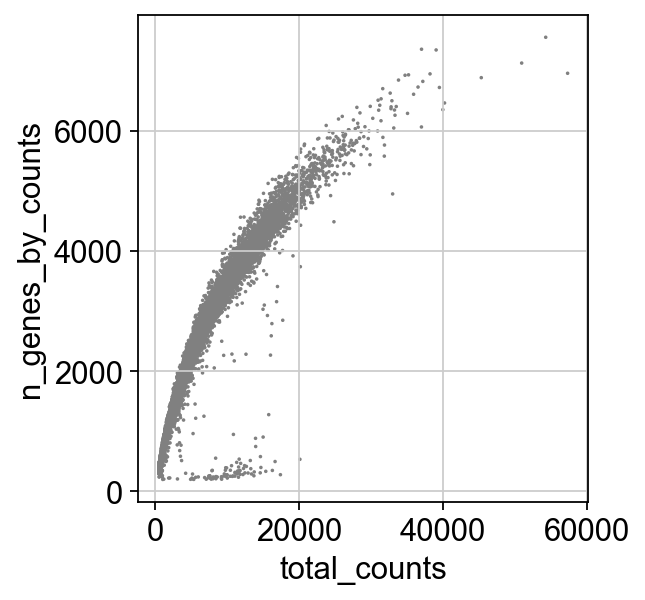

In [184]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


 Now that we have an idea of how some of the common QC metrics look, we can pick some thresholds to filter the dataset further to remove low quality cells.

 Let's remove cells with a low number of genes detected (<500) and a high percentage of counts that come from mitochondrial genes (>20%).

In [185]:
adata = adata[adata.obs.pct_counts_mt < 20, :]
adata = adata[adata.obs.n_genes_by_counts > 500, :]


 Redrawing these plots shows that we have removed some of the cells with low quality metrics.

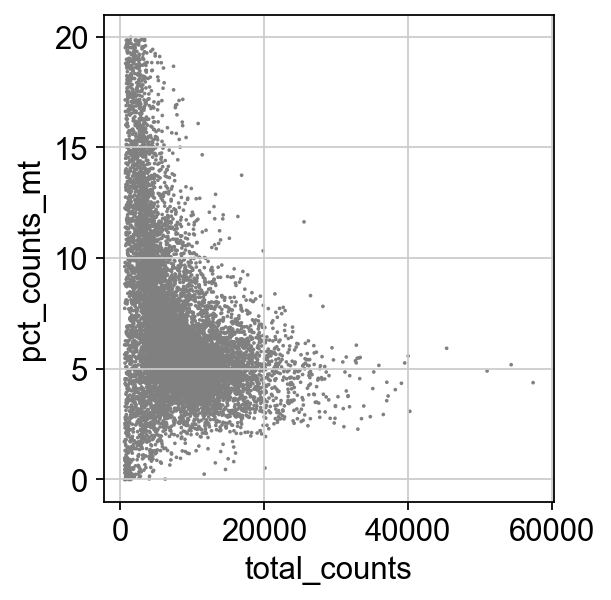

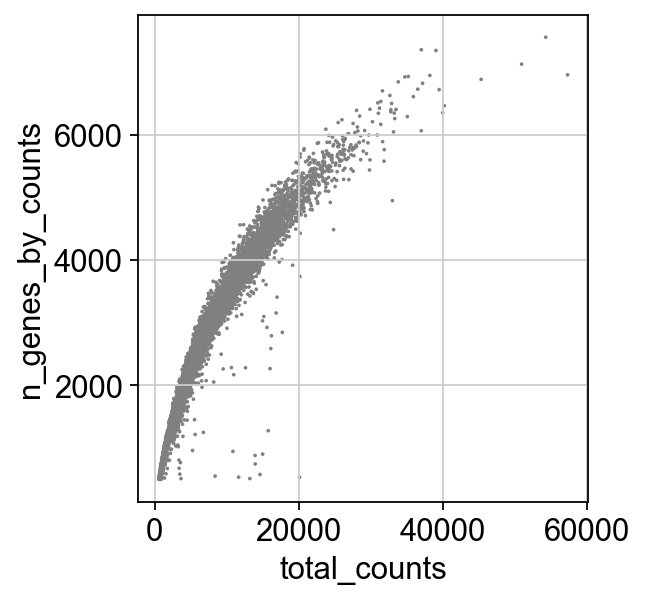

In [186]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


 ## Normalization
 Now that we've cleaned up the data a bit, we can move on to normalization. But first, let's retain our raw counts in a separate layer of the anndata object.
 


In [187]:
adata.layers['raw_counts'] = adata.X.copy()  # store raw counts

/var/folders/ss/6m3fgpds2qz29nywcpqxgbs00000gn/T/ipykernel_92267/4137654729.py:1: ImplicitModificationWarning: Setting element `.layers['raw_counts']` of view, initializing view as actual.


In [188]:
adata.layers 

Layers with keys: raw_counts


 Normalization is the process of adjusting the data to account for differences in sequencing depth between cells and other technical effects.

 There are a number of different normalization methods available. Here, we will use the `normalize_total` function from `scanpy` to normalize the data by the total counts per cell.

 This function normalizes the counts for each cell by the total counts in that cell, multiplies the result by a scale factor (default is 10,000).

In [189]:
# Total-count normalize (library size correct) the data matrix
sc.pp.normalize_total(adata, target_sum=1e4)


normalizing counts per cell
    finished (0:00:00)


 After normalization, we can log transform the data to reduce the effects of high count outliers, control variance, and make the data more normally distributed.

In [190]:
# Log transform
sc.pp.log1p(adata)


And now, let's just make a copy of our log-normalized data to a new layer for safekeeping.

In [191]:
adata.layers['log1p'] = adata.X.copy()  # store log-normalized data

 ## Highly variable gene selection
 Next, we want to focus our downstream analysis on genes that are highly variable across cells, or more specifically, genes with variance in excess of what is expected based on the technical noise in the data.

 To do this, we fit a mean-variance relationship to the data and use this to identify genes that are outside of the expected range.

In [192]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=4, min_disp=0.25)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


 The selection criteria above are relatively arbitrary and should be adjusted based on the dataset and experimental design.

 Let's take a look at the genes that were selected as highly variable.

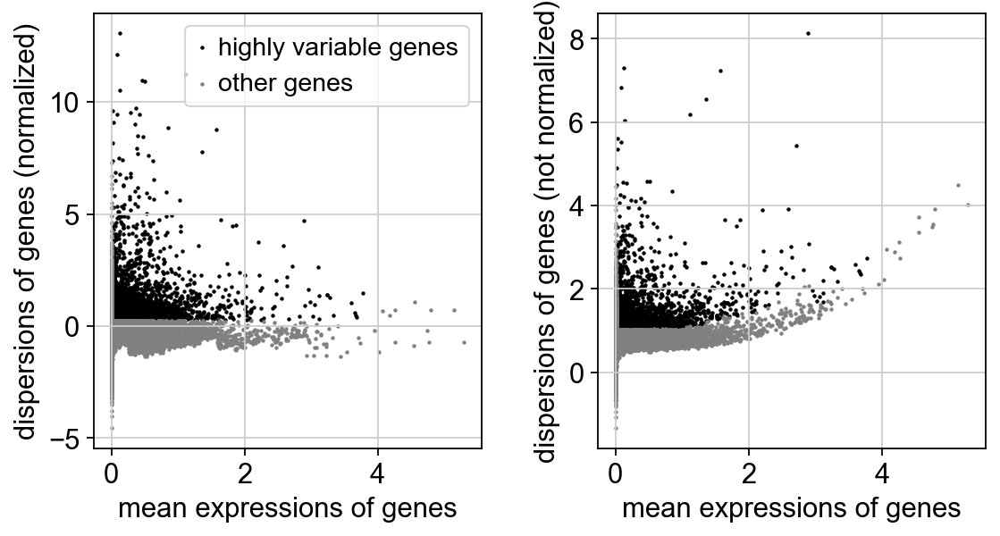

In [193]:
sc.pl.highly_variable_genes(adata,)


 Let's save the current state of the anndata object to the `raw` attribute of the anndata object. This will allow us to easily access these values later if we need to after additional filtering or processing.

In [194]:
adata.raw = adata

 Let's take this opportunity to write the results of this analysis to a file for future use.

 We will write the whole anndata `adata` object to a `.h5ad` file.

 This will allow us to easily load the results of this analysis into a new python session for further analysis or visualization.

 This can be done at any time with the `.write()` method of the anndata object.

In [195]:
adata.write("data/E18_mouse_cortex.h5ad")

 For the rest of the downstream analysis, we are going to only focus on the highly variable genes.

 So we will further subset the adata object to only include these. This will make many of the downstream steps go significantly faster (fewer genes over which to operate). 

 **Note**: This is an optional step, and I normally would not advocate for this unless you are working with a very large dataset or have computational resource constraints. recommend against it if you are interested in examining specific genes that may not be highly variable or don't have an _a priori_ expectation of which genes may be important to your analysis.

In [196]:
#adata = adata[:, adata.var.highly_variable]


 ## Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed
 To 'correct' or 'fix' any bias that may be introduced by differences in sequencing depth between cells, we can regress out the effects of the total counts per cell and the percentage of mitochondrial genes expressed.

 This should always be considered 'optional' and should be done with caution. It is not always appropriate to do this, and it is not always appropriate to do this at this stage in the analysis.

 For example, if you're downstream analysis requires fitting the data to a linear model, you may not want to 'fix' the data in this way, but rather, 'fit' these parameters as part of your model.  It is not appropriate to do both.

In [197]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])


regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:00)


 ## Scale data to unit variance
 Finally, we want to scale the data to unit variance.

In [198]:
sc.pp.scale(adata, max_value=10)


 ## Principal component analysis
 The next step in our workflow is to perform a dimensionality reduction on the data.

 Most workflows default to using principal component analysis (PCA) for this step. But other approaches may be appropriate depending on the data and the experimental design.

 `scanpy` provides a convenient wrapper function in it's `tools` module (`tl`) for many of these tasks including pca.

In [199]:
sc.tl.pca(adata, svd_solver='arpack',
          use_highly_variable=True)


computing PCA
    with n_comps=50


/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None


    finished (0:00:01)


 Let's take a look at the results of the PCA. Let's start by looking at the first two principal components.

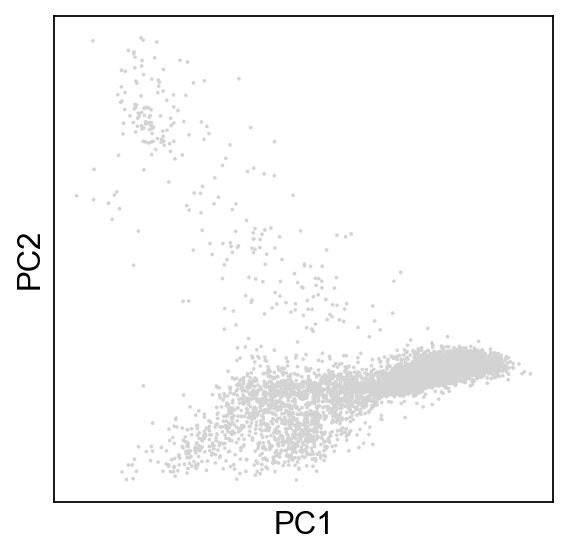

In [200]:
sc.pl.pca(adata)


 We can color the plot by different attributes in the `.obs` the anndata object to identify any potential batch effects or other confounding factors.

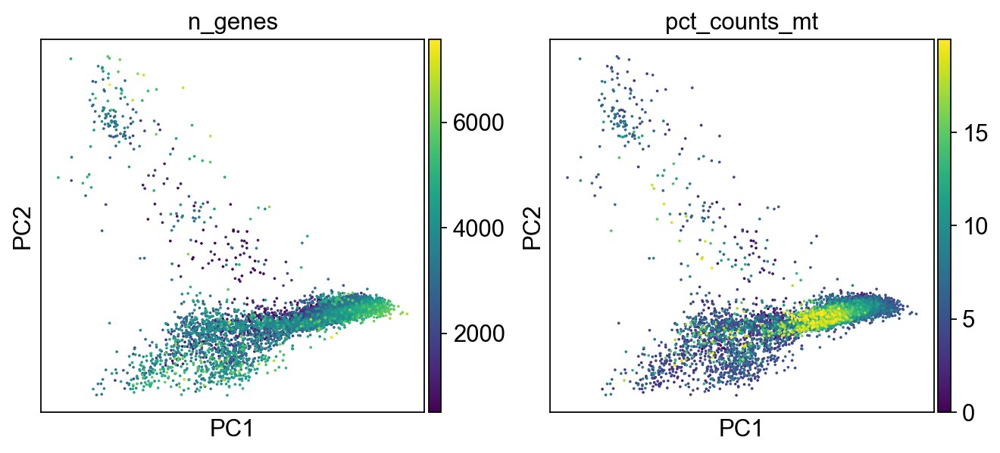

In [201]:
sc.pl.pca(adata, color=["n_genes","pct_counts_mt"])


 Here, for example, many of the cells in the top right corner of the plot have a relatively low number of genes.  This could be biological (ie erythrocytes) or it could be due to some technical issue.

 We can make a decision to go back and remove these cells from the analysis or keep this in mind as we explore further.

 We can also look at a screeplot to see how much variance is explained by each principal component.

 This will help us decide how many components to include in downstream analyses and further dimensionality reductions.

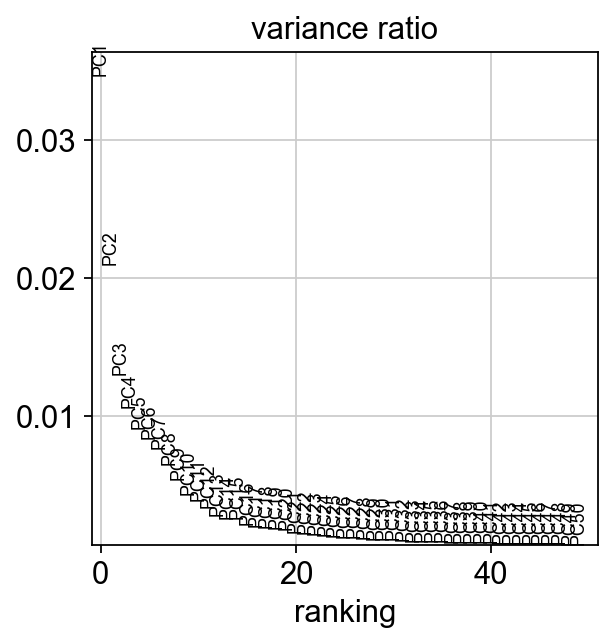

In [202]:
sc.pl.pca_variance_ratio(adata, log=False, n_pcs=50)


After about 30-40 components, the amount of variance explained by each additional component drops off significantly.  So we will use the first 40 components for downstream analysis.

 ## Computing the neighborhood graph
 The next step in our workflow is to compute a neighborhood graph of the data. This is the first step in the process of clustering the data.

 The neighborhood graph is a representation of the data where each cell is connected to its nearest neighbors. This is a way of representing the data in a lower dimensional space while preserving the local structure of the data.

 The `sc.pp.neighbors` function computes the neighborhood graph of the data. It uses the `X_pca` attribute of the anndata object as the input data. This is why we needed to run `sc.tl.pca` before running this step.

 The choice of `n_neighbors` and `n_pcs` can be modified/optimized based on the dataset and experimental design.

In [203]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


 The neighbors data is stored in .uns[‘neighbors’], distances and connectivities are stored in .obsp[‘distances’] and .obsp[‘connectivities’] respectively.

In [204]:
adata.uns['neighbors']


{'connectivities_key': 'connectivities',
 'distances_key': 'distances',
 'params': {'n_neighbors': 10,
  'method': 'umap',
  'random_state': 0,
  'metric': 'euclidean',
  'n_pcs': 40}}

 ## Clustering the neighborhood graph
 Now that we have computed the nearest neighbor graph, we can perform a 'community detection' algorithm to identify clusters of cells along the graph.

 The `sc.tl.leiden` function performs Leiden community detection on the neighborhood graph. It uses the `connectivities` attribute of the anndata object as the input data.

 This is an iterative algorithm that can be run multiple times to identify clusters at different resolutions. The `resolution` parameter controls the granularity of the clustering. Higher values lead to more clusters.

In [205]:
sc.tl.leiden(adata, flavor="igraph",resolution=0.3)


running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [206]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGCAACTCT-1,784,784,1421.0,3.0,0.211119,0
AAACCCACACGCGGTT-1,2400,2399,5832.0,698.0,11.968451,1
AAACCCACAGCATACT-1,1776,1775,2977.0,362.0,12.159892,0
AAACCCACATACCATG-1,1934,1934,3599.0,238.0,6.612948,2
AAACCCAGTCGCACAC-1,3473,3473,9152.0,452.0,4.938811,0
...,...,...,...,...,...,...
TTTGTTGGTAGCTAAA-1,3439,3439,9756.0,388.0,3.977040,5
TTTGTTGGTATCCCAA-1,1987,1987,4231.0,485.0,11.463011,1
TTTGTTGGTCCGAAAG-1,1404,1404,2415.0,72.0,2.981366,5
TTTGTTGGTTCAACGT-1,2529,2529,6103.0,341.0,5.587416,1


 We can revisit this clustering step later after we are able to visualize the results to decide if we need to adjust the `resolution` parameter.

 ## Partition-based graph abstraction (PAGA)
 We can next perform partition-based graph abstraction (PAGA) to coarse-grain the graph and identify the major partitions of the dataset.

 This is an optional step, but it can be useful for identifying the major partitions of the dataset and visualizing the relationships between them.

 [Wolf et al. (2019), PAGA: Graph abstraction reconciles clustering with trajectory inference through a topology preserving map of single cells.](https://doi.org/10.1186/s13059-019-1663-x)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


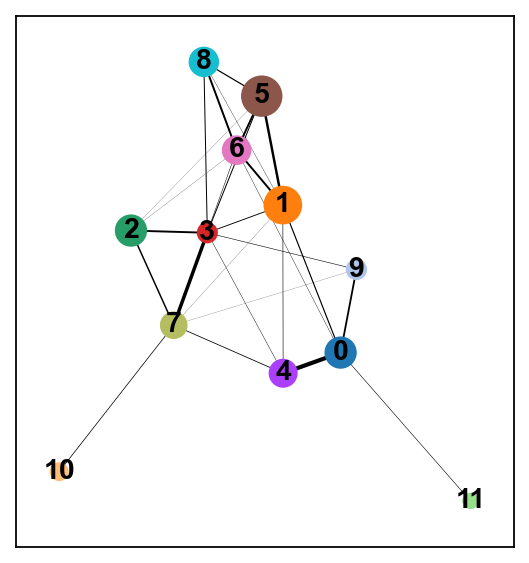

In [207]:
sc.tl.paga(adata)
sc.pl.paga(adata)


 This gives us a course idea of how the different clusters relate to each other based on their positions in the neighbors graph.

 We will also use these positions to initialize the UMAP embedding in the next step.

 The above plot is, by default, coloring each of the clusters by their assigned `leiden` cluster number.

--> added 'pos', the PAGA positions (adata.uns['paga'])


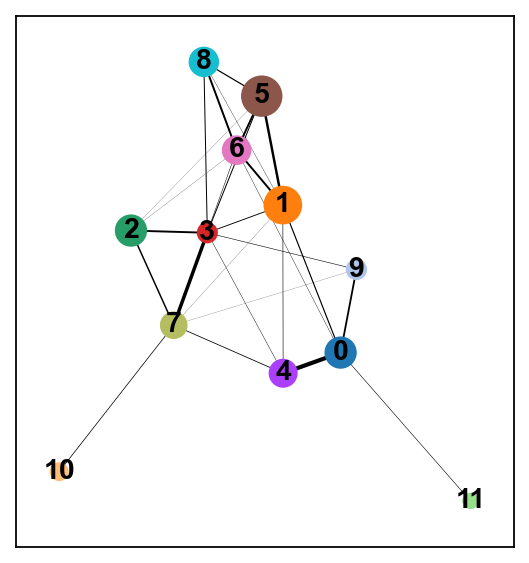

In [208]:
sc.pl.paga(adata, color='leiden')


 We can also color the plot by other attributes in the `.obs` attribute of the anndata object, or by the average gene expression for cells in each cluster.

 In this way we can start to get a feel for the biological differences between the clusters

--> added 'pos', the PAGA positions (adata.uns['paga'])


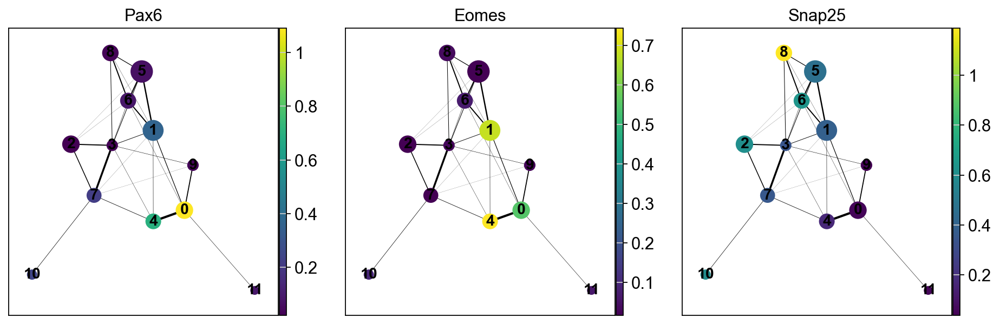

In [209]:
sc.pl.paga(adata, color=['Pax6','Eomes','Snap25'])


 ## Embedding the neighborhood graph
 Now that we have computed the neighborhood graph, identified clusters of cells, set initial coarse positions for each cluster in 2D, we can embed the full graph in two dimensions to visualize the results.

 To do this, we will use the non-linear dimensionality reduction tool called 'UMAP' (Uniform Manifold Approximation and Projection).

 Again, `scanpy` has a convenient wrapper function in it's `tools` module (`tl`) for this step.

In [210]:
sc.tl.umap(adata, init_pos='paga')


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:04)


 We can plot the cells in the UMAP embedding space with `sc.pl.umap`.

 Let's also color the cells by their assigned `leiden` cluster number.

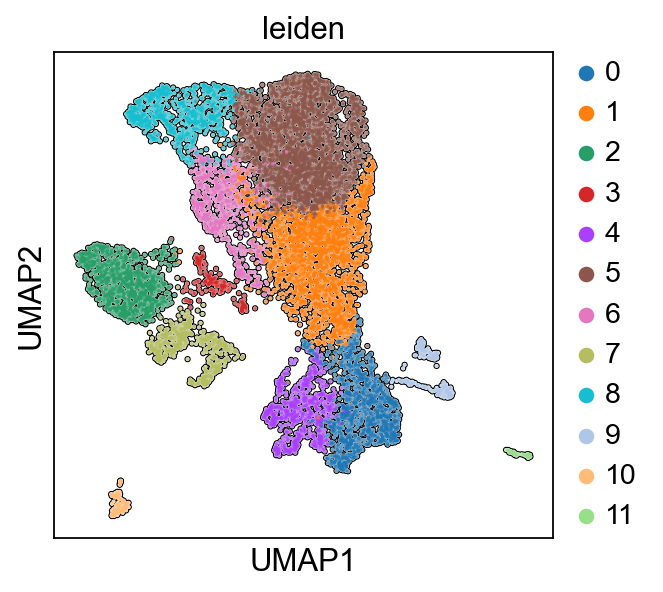

In [211]:
sc.pl.umap(adata,color='leiden', add_outline=True)


 We can also color the plot by other attributes in the `.obs` attribute of the anndata object, or by the expression of specific genes in each cell.

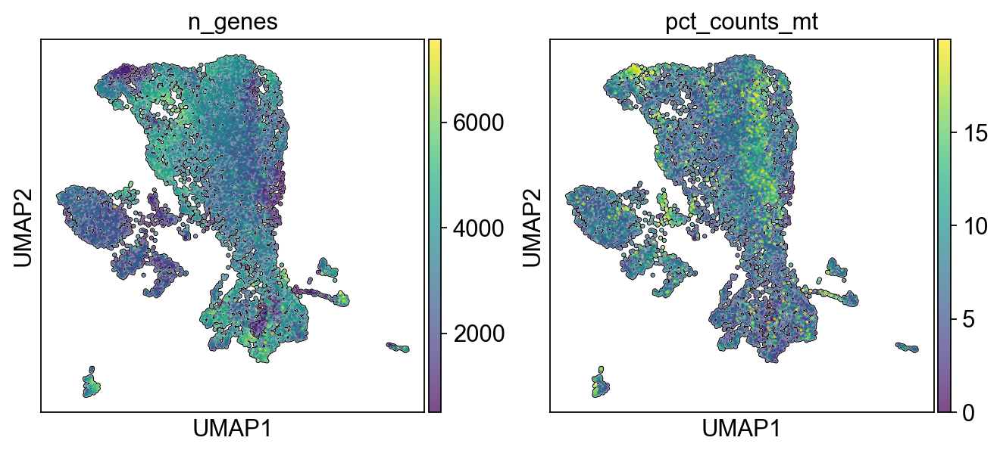

In [212]:
# QC metrics
sc.pl.umap(adata,color=["n_genes","pct_counts_mt"], add_outline=True)


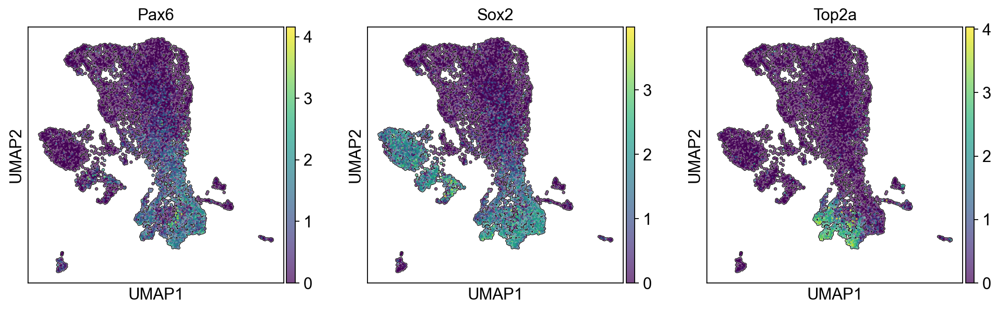

In [213]:
# Progenitor and cell cycle markers
sc.pl.umap(adata,color=['Pax6','Sox2','Top2a'], add_outline=True)


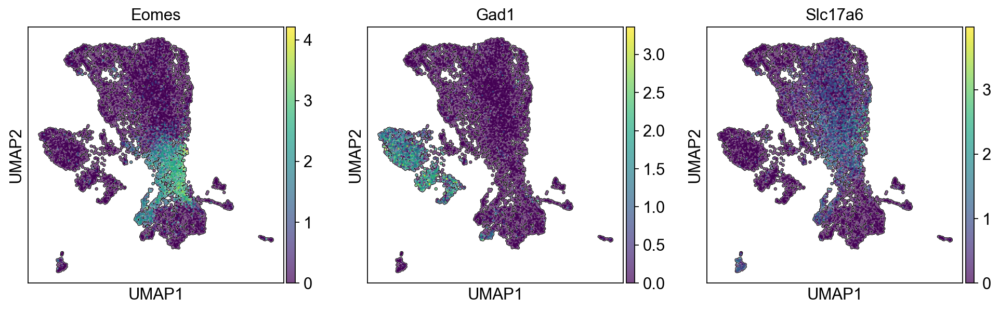

In [214]:
# Neuronal subtype markers
sc.pl.umap(adata,color=['Eomes','Gad1','Slc17a6'], add_outline=True)


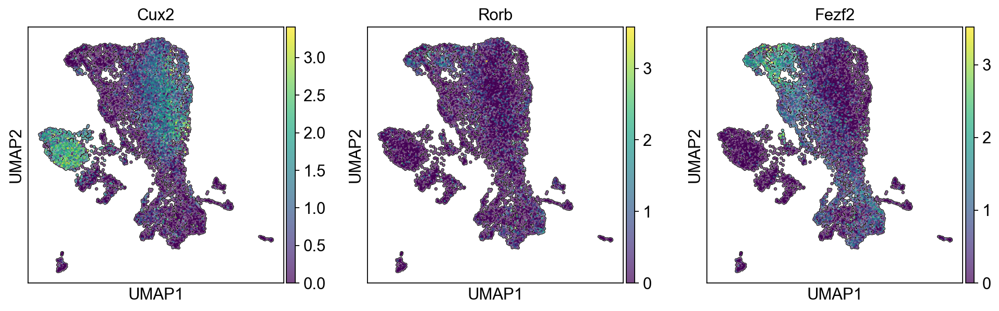

In [215]:
#Cortical Neuronal subtype markers
sc.pl.umap(adata,color=['Cux2','Rorb','Fezf2'], add_outline=True)


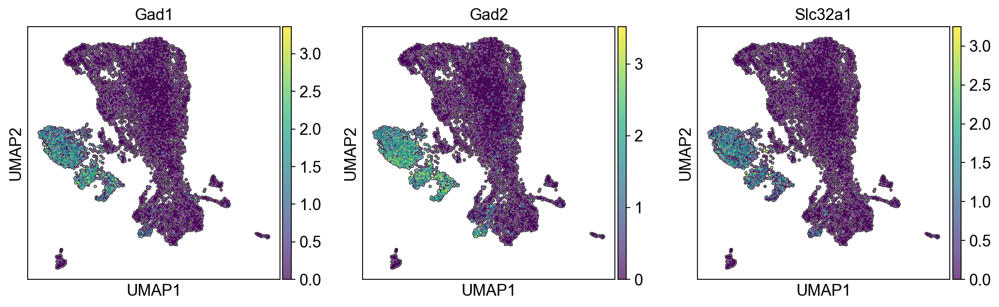

In [216]:
# Inhibitory neuron markers
sc.pl.umap(adata,color=['Gad1','Gad2','Slc32a1'], add_outline=True)


 ## Finding marker genes (Differential expression w.r.t cluster)
 Now that we have identified clusters of cells, we can identify genes that are differentially expressed between clusters.

 We can do this using the `sc.tl.rank_genes_groups` function. This function performs a statistical test to identify genes that are differentially expressed between groupings defined in `.obs` (cell metadata).

 We can start by identifying marker genes for each cluster. We can do this by setting `groupby='leiden'` to identify marker genes for each cluster defined by the `leiden` cluster assignments.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


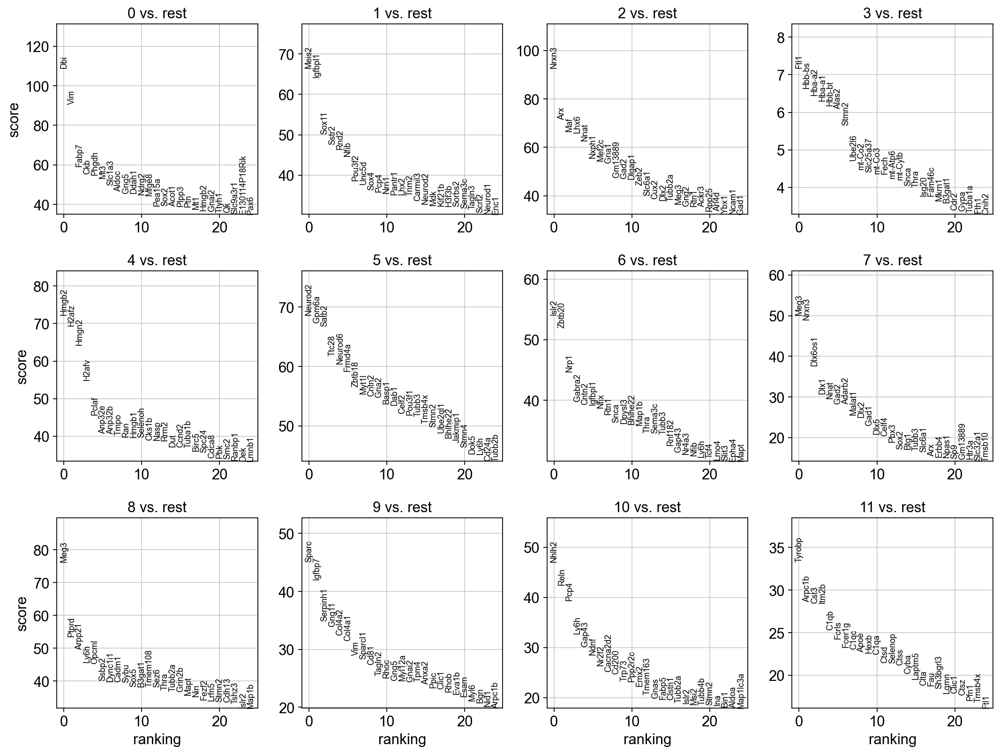

In [217]:
# via T-test
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [218]:
adata.var

,gene_ids,feature_types,genome,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
Xkr4,ENSMUSG00000051951,Gene Expression,mm10,800,False,800,0.079670,93.131868,928.0,True,0.129137,1.218364,0.666080,-1.756081e-12,0.273681
Rp1,ENSMUSG00000025900,Gene Expression,mm10,9,False,9,0.000944,99.922734,11.0,False,0.001205,0.656080,-0.480786,-4.160351e-12,0.026032
Sox17,ENSMUSG00000025902,Gene Expression,mm10,81,False,81,0.028417,99.304602,331.0,True,0.030396,2.134256,2.534186,4.941345e-11,0.132689
Mrpl15,ENSMUSG00000033845,Gene Expression,mm10,6114,False,6114,0.946343,47.510302,11023.0,False,0.768654,0.564765,-1.119241,2.942306e-11,0.566726
Lypla1,ENSMUSG00000025903,Gene Expression,mm10,1563,False,1563,0.153760,86.581387,1791.0,False,0.193021,0.895571,0.007694,2.724067e-11,0.321639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Gm10931,ENSMUSG00000094350,Gene Expression,mm10,4,False,4,0.000343,99.965659,4.0,False,0.000372,0.652748,-0.487582,2.572221e-12,0.014577
AC168977.1,ENSMUSG00000079808,Gene Expression,mm10,14,False,14,0.001202,99.879808,14.0,False,0.001902,1.008213,0.237444,-5.680494e-12,0.032443
AC149090.1,ENSMUSG00000095041,Gene Expression,mm10,3270,False,3270,0.404962,71.926511,4717.0,True,0.501251,1.533870,1.779379,-1.314223e-10,0.533282
CAAA01118383.1,ENSMUSG00000063897,Gene Expression,mm10,1947,False,1947,0.194626,83.284684,2267.0,False,0.245950,1.011715,0.244587,-3.850529e-11,0.363677


 `method=t-test` performs a Welch's t-test to identify genes that are differentially expressed between the groups.

 It does this by comparing the mean expression of each gene in each group in 1-vs-all comparisons. It then uses a Bonferroni correction to adjust the p-values for multiple comparisons.

 While the t-test is a relatively fast and simple test, it does make some assumptions about the data that may not be appropriate for single cell data. For example, it assumes that the data are normally distributed.

 We can also use `method='wilcoxon'` to perform a Wilcoxon rank sum test instead, which is a non-parametric test that is more appropriate for single cell data.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


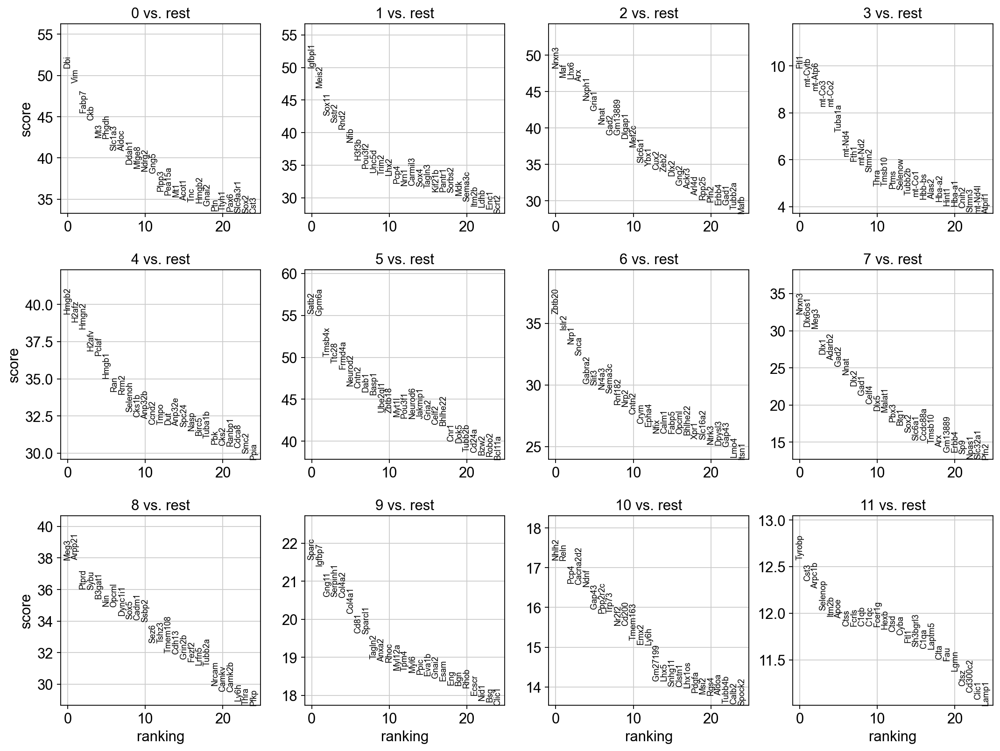

In [219]:
# Via Wilcoxon rank sum
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


 `rank_genes_groups` returns a structured array with the results of the test.

 We can access this using the `.uns` attribute of the anndata object.

In [220]:
adata.uns['rank_genes_groups']


{'params': {'groupby': 'leiden',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('Dbi', 'Igfbpl1', 'Nrxn3', 'Ftl1', 'Hmgb2', 'Satb2', 'Zbtb20', 'Nrxn3', 'Meg3', 'Sparc', 'Nhlh2', 'Tyrobp'),
            ('Vim', 'Meis2', 'Maf', 'mt-Cytb', 'H2afz', 'Gpm6a', 'Islr2', 'Dlx6os1', 'Arpp21', 'Igfbp7', 'Reln', 'Cst3'),
            ('Fabp7', 'Sox11', 'Lhx6', 'mt-Atp6', 'Hmgn2', 'Tmsb4x', 'Nrp1', 'Meg3', 'Ptprd', 'Gng11', 'Pcp4', 'Arpc1b'),
            ...,
            ('Tmsb10', 'Mapt', 'Meis2', 'Auts2', 'Thra', 'Vim', 'Cux1', 'Lhx2', 'Lhx2', 'Rtn1', 'Foxg1', 'Stmn1'),
            ('Basp1', 'Map1b', 'Nfix', 'Rsrp1', 'Rtn1', 'Sox2', 'Pou3f2', 'Neurod6', 'Zbtb20', 'Stmn1', 'Celf2', 'Tubb2b'),
            ('Tubb3', 'Tubb2a', 'Nfib', 'Malat1', 'Tubb2b', 'Zbtb20', 'Ptn', 'Neurod2', 'H3f3b', 'Tubb2b', 'Sox11', 'Tuba1a')],
           dtype=[('0', 'O'), ('1', 'O'), ('2', 'O'), ('3', 'O'), ('4', 'O'), ('5', '

 Let's get a list of the ranked genes by cluster from this array.

In [221]:
ranked_genes_by_cluster = pd.DataFrame(adata.uns['rank_genes_groups']['names'])

ranked_genes_by_cluster.head(10)


,0,1,2,3,4,5,6,7,8,9,10,11
0,Dbi,Igfbpl1,Nrxn3,Ftl1,Hmgb2,Satb2,Zbtb20,Nrxn3,Meg3,Sparc,Nhlh2,Tyrobp
1,Vim,Meis2,Maf,mt-Cytb,H2afz,Gpm6a,Islr2,Dlx6os1,Arpp21,Igfbp7,Reln,Cst3
2,Fabp7,Sox11,Lhx6,mt-Atp6,Hmgn2,Tmsb4x,Nrp1,Meg3,Ptprd,Gng11,Pcp4,Arpc1b
3,Ckb,Sstr2,Arx,mt-Co3,H2afv,Ttc28,Snca,Dlx1,Sybu,Serpinh1,Cacna2d2,Selenop
4,Mt3,Rnd2,Nxph1,mt-Co2,Pclaf,Frmd4a,Gabra2,Adarb2,B3gat1,Col4a2,Ndnf,Itm2b
5,Phgdh,Nfib,Gria1,Tuba1a,Hmgb1,Neurod2,Slit3,Gad2,Nin,Col4a1,Gap43,Apoe
6,Slc1a3,H3f3b,Nnat,mt-Nd4,Ran,Cntn2,Nr4a3,Nnat,Opcml,Cd81,Ppp2r2c,Ctss
7,Aldoc,Pou3f2,Gad2,Fth1,Rrm2,Dab1,Sema3c,Dlx2,Dync1i1,Sparcl1,Trp73,Fcrls
8,Ddah1,Unc5d,Gm13889,mt-Nd2,Selenoh,Basp1,Rnf182,Gad1,Sox5,Tagln2,Nr2f2,C1qb
9,Mfge8,Trim2,Dlgap1,Stmn2,Cks1b,Ube2ql1,Nrp2,Celf4,Cadm1,Anxa2,Cd200,C1qc


 This list can be exceptionally helpful in identifying cell types and states based on the expression of known marker genes.

 ## Visualizing marker genes
 We can visualize the expression of these marker genes in a number of different ways.

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


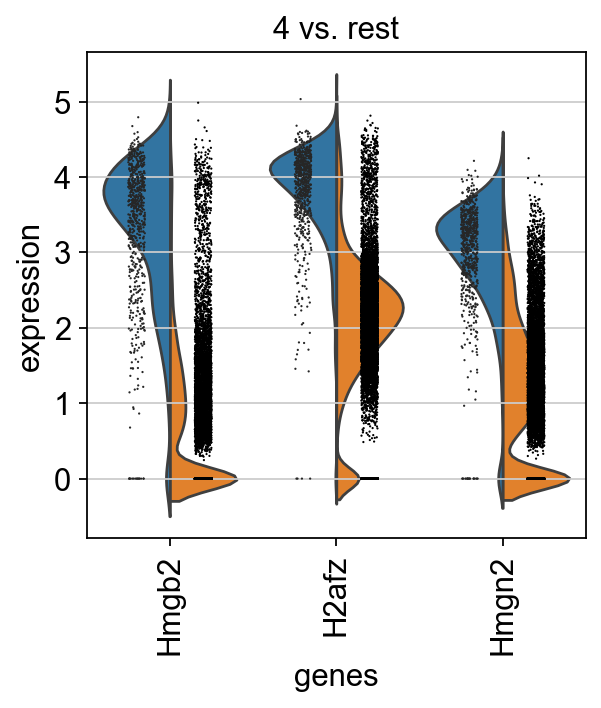

In [222]:
sc.pl.rank_genes_groups_violin(adata, groups=["4"], n_genes=3 )


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


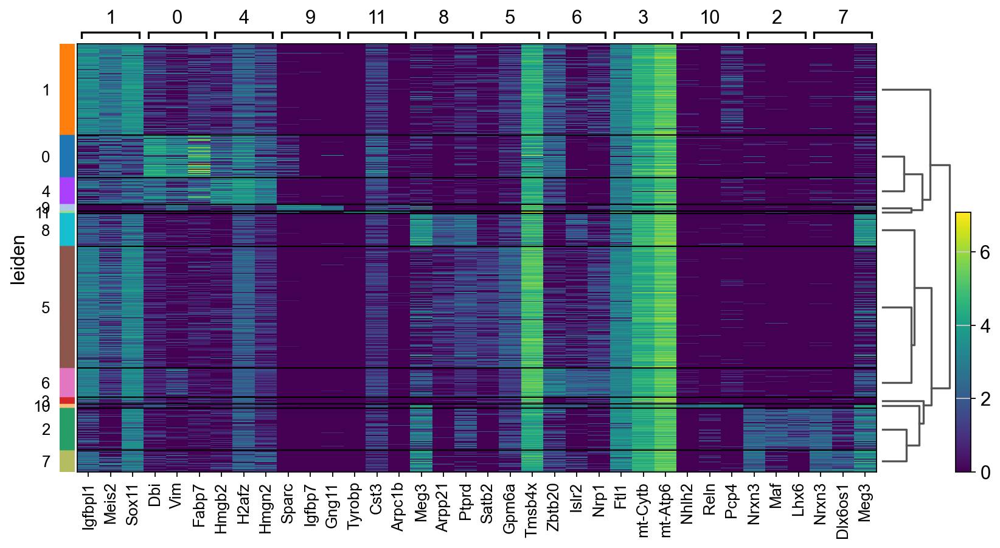

In [223]:
sc.pl.rank_genes_groups_heatmap(adata,n_genes=3)


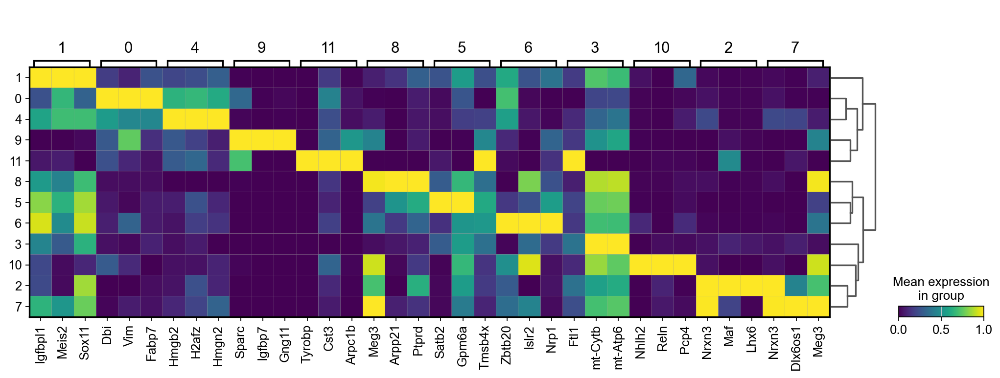

In [224]:
sc.pl.rank_genes_groups_matrixplot(adata,n_genes=3,standard_scale='var')


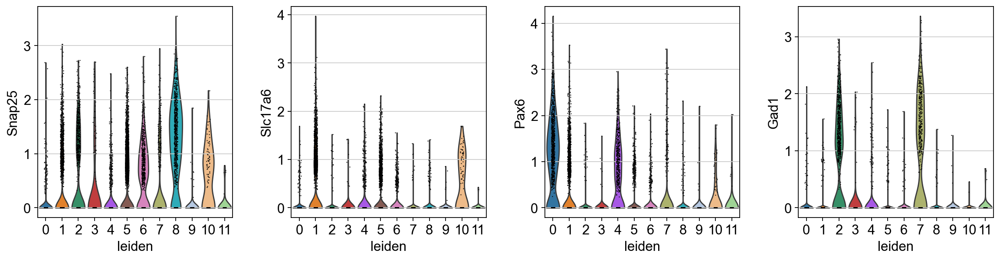

In [225]:
sc.pl.violin(adata, ['Snap25','Slc17a6','Pax6','Gad1'], groupby='leiden')


 We can get a list of the top 2 marker genes for each cluster and use this list to plot more information about this subset of genes.

In [226]:
marker_genes = ranked_genes_by_cluster.head(2).T.to_numpy().flatten().tolist()

marker_genes

['Dbi',
 'Vim',
 'Igfbpl1',
 'Meis2',
 'Nrxn3',
 'Maf',
 'Ftl1',
 'mt-Cytb',
 'Hmgb2',
 'H2afz',
 'Satb2',
 'Gpm6a',
 'Zbtb20',
 'Islr2',
 'Nrxn3',
 'Dlx6os1',
 'Meg3',
 'Arpp21',
 'Sparc',
 'Igfbp7',
 'Nhlh2',
 'Reln',
 'Tyrobp',
 'Cst3']

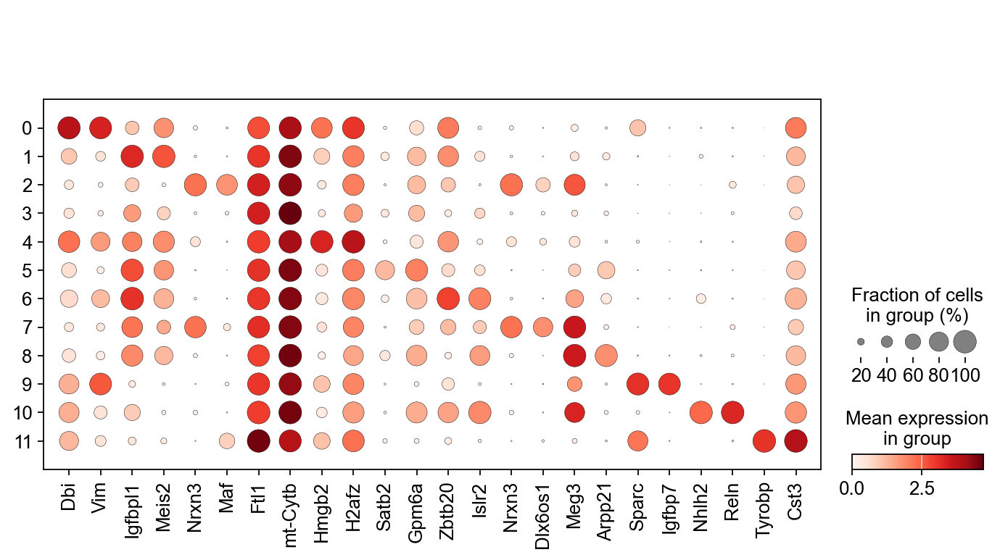

In [227]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden')


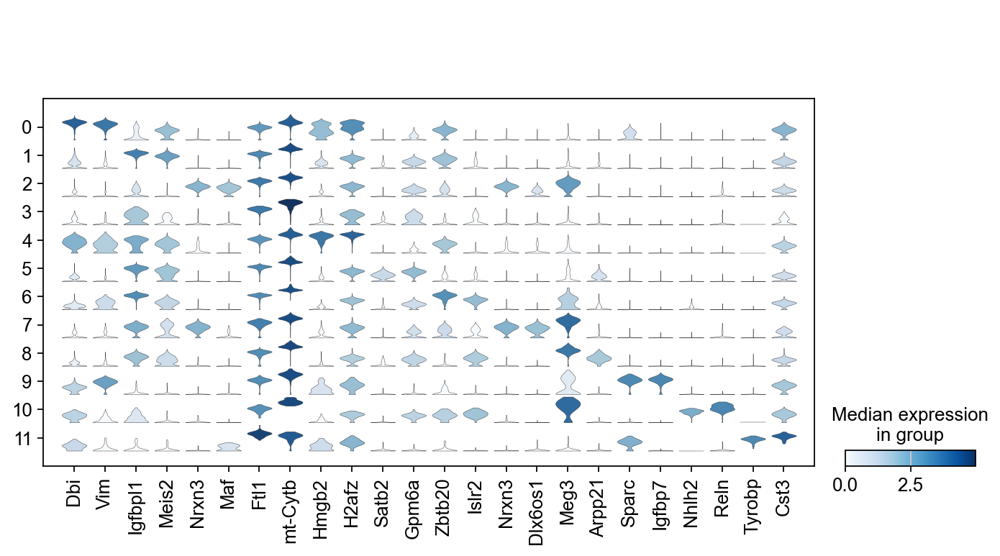

In [228]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden')


In [ ]:
adata.write("data/E18_mouse_cortex.h5ad")

 Here's where we will end our introductory analysis.

 The section below showcases an additional analysis using `scFates` to identify cell state transitions and pseudotime ordering of the subset of cells that are excitatory neurons.

 This is an optional section that is included for those who are interested in learning more about these topics.
 Subset to only excitatory neurons and their progenitors

 ## Pseudotemporal analysis of Excitatory neuron development

 ### Subset Excitatory Neurons
 Identify clusters of excitatory neurons (main partition) and create a new anndata object with only these cells.

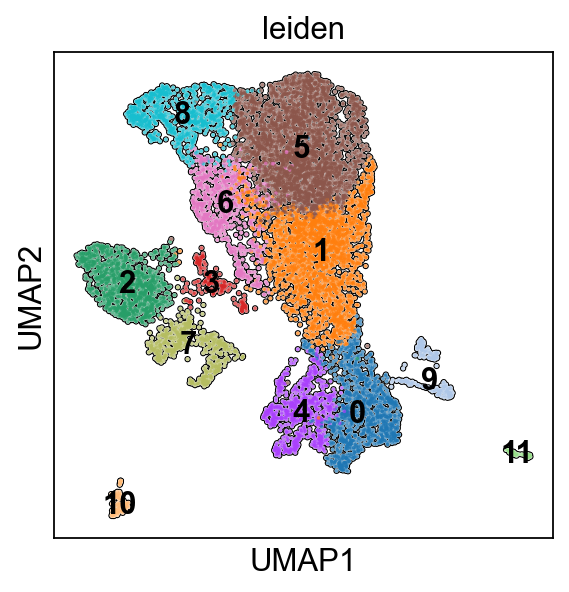

In [180]:
sc.pl.umap(adata,color='leiden',legend_loc='on data', add_outline=True)

ex_neuron_clusters = ["0","1","4","5","6","8"]

adata_ex = adata[adata.obs['leiden'].isin(ex_neuron_clusters),:].copy()


 Import the scFates python module

In [181]:
adata_ex

AnnData object with n_obs × n_vars = 8748 × 4472
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'leiden_colors', 'umap', 'rank_genes_groups', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p'
    obsp: 'distances', 'connectivities'

In [182]:
import scFates as scf


 Redo-PCA analysis on the subset of excitatory neurons

In [183]:
sc.tl.pca(adata_ex, svd_solver='arpack')


computing PCA
    with n_comps=50
    finished (0:00:01)


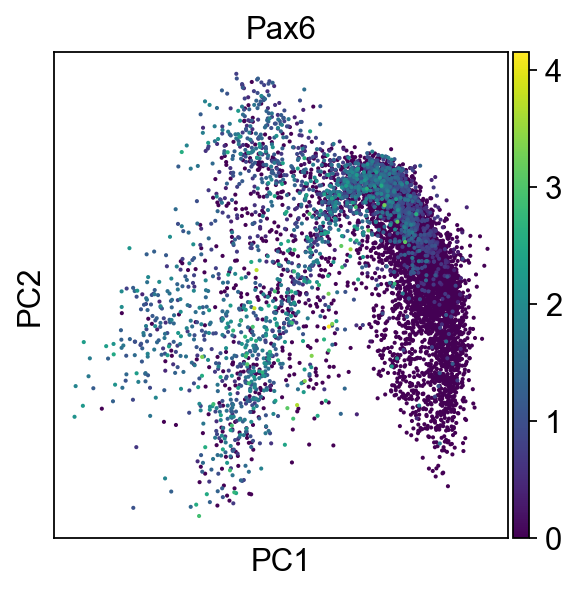

In [184]:
sc.pl.pca(adata_ex,color=["Pax6"])


 Fit a principal curve to the first two principal components

In [185]:
scf.tl.curve(adata_ex,
             Nodes=12,
             use_rep="X_pca",
             ndims_rep=2,
             )


inferring a principal curve --> parameters used 
    12 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.


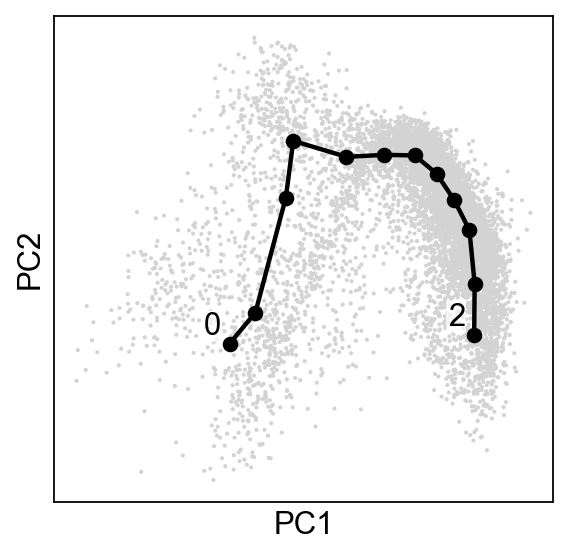

In [186]:
scf.pl.graph(adata_ex,basis="pca")


 Identify the root of the principal curve based on the expression of the radial glial marker gene 'Pax6' (marks progenitors).

In [187]:
scf.tl.root(adata_ex,"Pax6")


automatic root selection using Pax6 values
node 0 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


 Calculate pseudotime position for each cell based on the principal curve

In [188]:
scf.tl.pseudotime(adata_ex,
                  n_jobs=20,
                  n_map=100,
                  seed=42)


projecting cells onto the principal graph
    mappings: 100%|██████████████████████████| 100/100 [00:28<00:00,  3.52it/s]
    finished (0:00:29) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


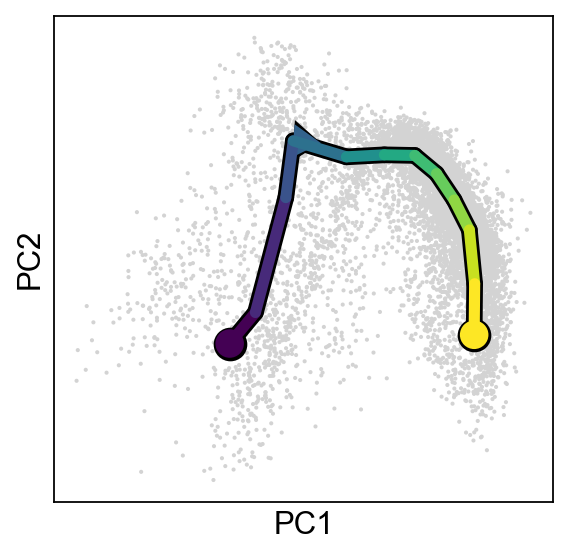

In [189]:
scf.pl.trajectory(adata_ex,basis="pca",arrows=True,arrow_offset=3)


 Identify 'milestones' as key transitions along the trajectory

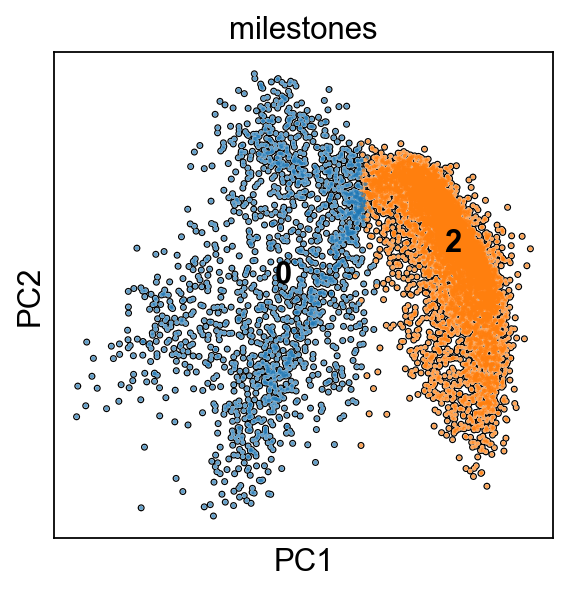

In [190]:
sc.pl.pca(adata_ex,color="milestones",legend_loc='on data', add_outline=True)


 Rename milestones to provide more context

In [191]:
scf.tl.rename_milestones(adata_ex,new={"0":"Progenitors (RG)","2": "Maturing Neurons"})


/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:82: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


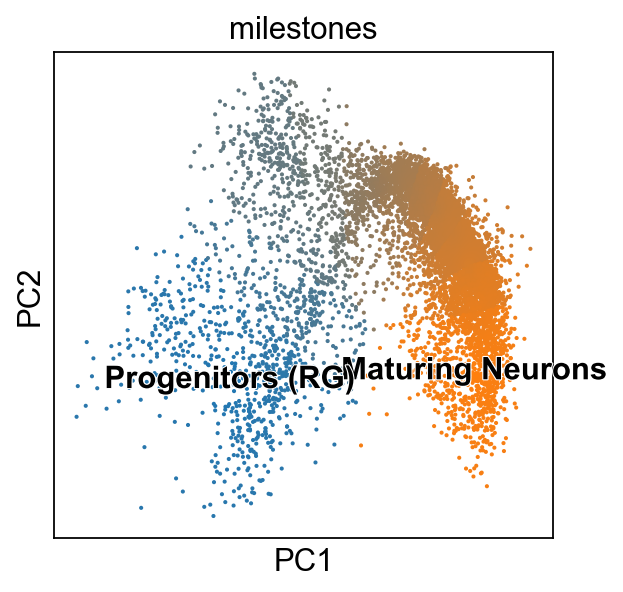

In [192]:
scf.pl.milestones(adata_ex,basis="pca",annotate=True)


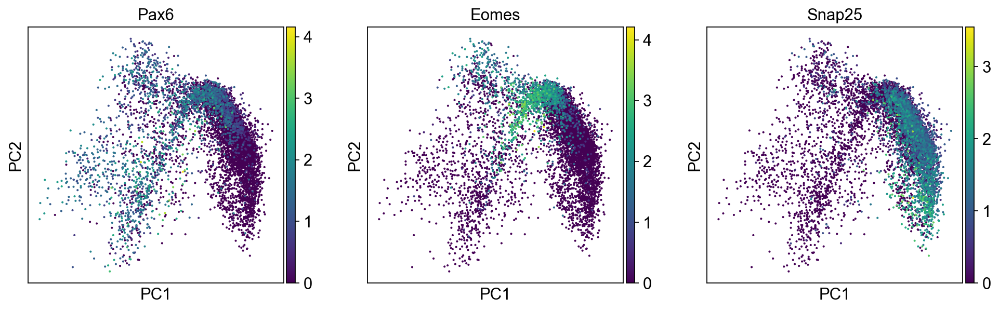

In [193]:
sc.pl.pca(adata_ex,color=["Pax6","Eomes","Snap25"])


 Identify genes that are differentially expressed along the trajectory

In [194]:
scf.tl.test_association(adata_ex,
                        n_jobs=20)


test features for association with the trajectory
    single mapping :   9%|█▋                | 420/4472 [00:12<01:57, 34.40it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping : 100%|█████████████████| 4472/4472 [02:54<00:00, 25.60it/s]
    found 989 significant features (0:02:54) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.


In [195]:
scf.tl.test_association(adata_ex,
                        reapply_filters=True,
                        A_cut=.5,
                        )


reapplied filters, 1966 significant features


 Fit a generalized additive model to the expression of each gene along the trajectory to make a smooth trend

In [196]:
scf.tl.fit(adata_ex,
           n_jobs=20)


fit features associated with the trajectory
    single mapping :   2%|▎                  | 38/1966 [00:02<01:57, 16.38it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :   3%|▌                  | 57/1966 [00:03<01:59, 15.98it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :   5%|▊                  | 89/1966 [00:06<02:22, 13.20it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :   5%|▉                 | 105/1966 [00:08<02:25, 12.81it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :   8%|█▍                | 161/1966 [00:12<02:24, 12.53it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  10%|█▉                | 206/1966 [00:16<02:17, 12.76it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  11%|█▉                | 208/1966 [00:17<02:23, 12.23it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  11%|██                | 222/1966 [00:17<02:20, 12.38it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  11%|██                | 224/1966 [00:19<02:28, 11.71it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  14%|██▍               | 268/1966 [00:22<02:21, 12.04it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  14%|██▌               | 283/1966 [00:23<02:18, 12.11it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  15%|██▋               | 298/1966 [00:25<02:21, 11.75it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  17%|███               | 333/1966 [00:30<02:29, 10.92it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  19%|███▎              | 367/1966 [00:33<02:25, 11.02it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  21%|███▊              | 416/1966 [00:36<02:15, 11.43it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  23%|████              | 448/1966 [00:38<02:10, 11.63it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  28%|█████             | 548/1966 [00:44<01:56, 12.22it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  33%|█████▉            | 644/1966 [00:50<01:44, 12.70it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  34%|██████            | 662/1966 [00:51<01:42, 12.77it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  35%|██████▎           | 690/1966 [00:54<01:40, 12.72it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  36%|██████▍           | 707/1966 [00:55<01:38, 12.75it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  37%|██████▋           | 732/1966 [00:59<01:39, 12.38it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  38%|██████▊           | 747/1966 [01:00<01:38, 12.36it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  40%|███████▏          | 782/1966 [01:04<01:37, 12.15it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  41%|███████▎          | 798/1966 [01:05<01:35, 12.19it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  41%|███████▍          | 813/1966 [01:06<01:34, 12.18it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  42%|███████▌          | 828/1966 [01:07<01:33, 12.18it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  43%|███████▋          | 843/1966 [01:09<01:33, 12.05it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  55%|█████████▍       | 1089/1966 [01:25<01:08, 12.78it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  56%|█████████▌       | 1108/1966 [01:26<01:06, 12.85it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  58%|█████████▊       | 1140/1966 [01:29<01:05, 12.67it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  59%|█████████▉       | 1155/1966 [01:31<01:04, 12.64it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  60%|██████████▏      | 1183/1966 [01:33<01:01, 12.63it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  60%|██████████▏      | 1184/1966 [01:34<01:02, 12.52it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  63%|██████████▊      | 1247/1966 [01:38<00:56, 12.64it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  66%|███████████▏     | 1298/1966 [01:41<00:52, 12.73it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  66%|███████████▏     | 1299/1966 [01:44<00:53, 12.44it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  68%|███████████▍     | 1328/1966 [01:46<00:51, 12.49it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  68%|███████████▍     | 1329/1966 [01:47<00:51, 12.38it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  70%|███████████▊     | 1373/1966 [01:50<00:47, 12.44it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  72%|████████████▎    | 1420/1966 [01:53<00:43, 12.50it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  73%|████████████▍    | 1437/1966 [01:54<00:42, 12.52it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  75%|████████████▊    | 1480/1966 [01:57<00:38, 12.54it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  78%|█████████████▎   | 1539/1966 [02:01<00:33, 12.62it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  82%|█████████████▉   | 1610/1966 [02:06<00:27, 12.77it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  83%|██████████████   | 1628/1966 [02:07<00:26, 12.79it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  89%|███████████████  | 1742/1966 [02:14<00:17, 12.95it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  90%|███████████████▎ | 1778/1966 [02:16<00:14, 13.03it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  91%|███████████████▌ | 1796/1966 [02:17<00:13, 13.05it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  92%|███████████████▋ | 1811/1966 [02:20<00:12, 12.91it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  93%|███████████████▉ | 1837/1966 [02:23<00:10, 12.81it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  93%|███████████████▉ | 1838/1966 [02:24<00:10, 12.73it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  94%|████████████████ | 1852/1966 [02:25<00:08, 12.74it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  96%|████████████████▎| 1892/1966 [02:28<00:05, 12.73it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  97%|████████████████▍| 1908/1966 [02:29<00:04, 12.75it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  98%|████████████████▋| 1923/1966 [02:30<00:03, 12.74it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping :  99%|████████████████▊| 1938/1966 [02:32<00:02, 12.73it/s]

/Users/loyalgoff/miniforge3/envs/neurogenomics/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


    single mapping : 100%|█████████████████| 1966/1966 [02:37<00:00, 12.48it/s]
    finished (adata subsetted to keep only fitted features!) (0:02:38) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


 Plot the expression of a few genes along the trajectory

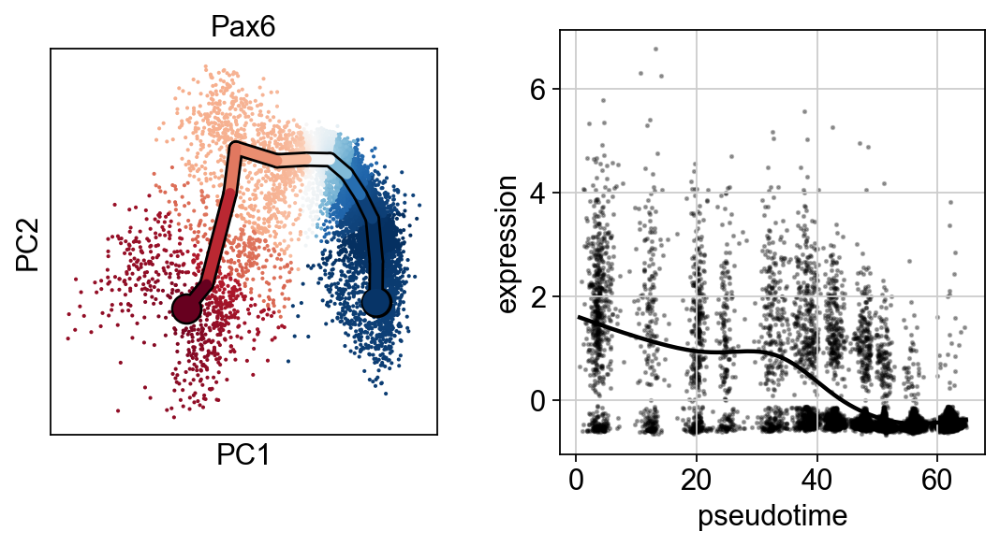

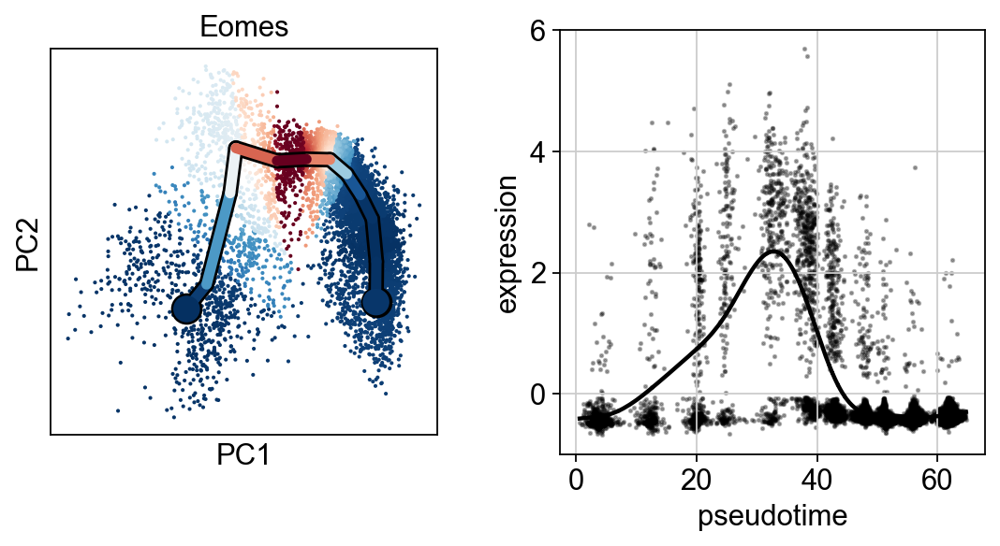

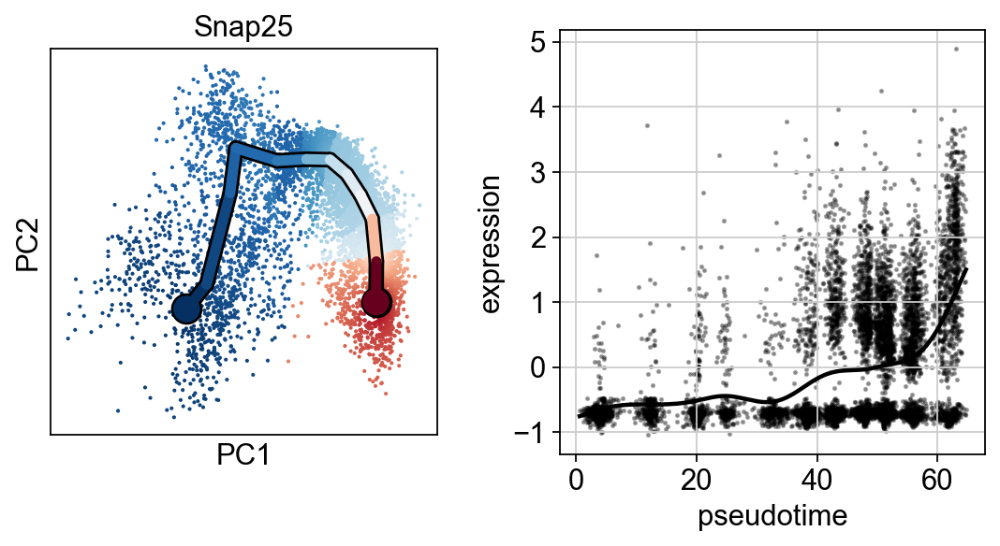

In [197]:
scf.pl.single_trend(adata_ex,"Pax6",basis="pca",color_exp="k")
scf.pl.single_trend(adata_ex,"Eomes",basis="pca",color_exp="k")
scf.pl.single_trend(adata_ex,"Snap25",basis="pca",color_exp="k")


 Cluster the genes based on their expression trends along the pseudotime trajectory

In [198]:
scf.tl.cluster(adata_ex,
               n_neighbors=100,
               metric="correlation",
               )


Clustering features using fitted layer
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
    finished (0:00:02) --> added 
    .var['clusters'] identified modules.


 Draw a heatmap of the expression of the genes in each cluster along the trajectory

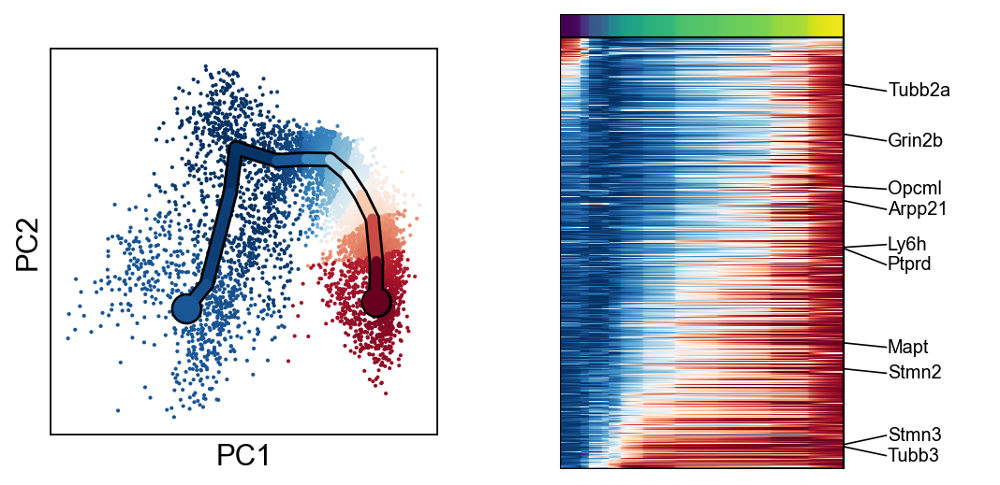

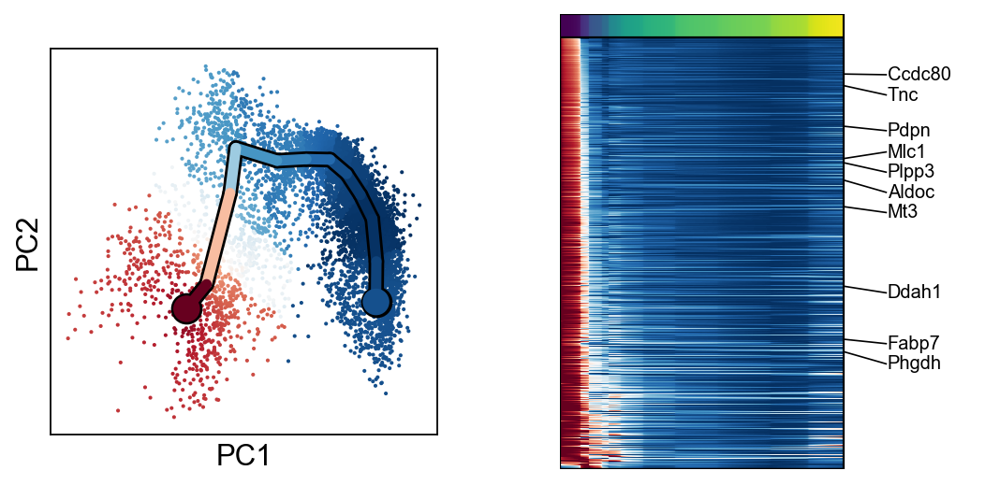

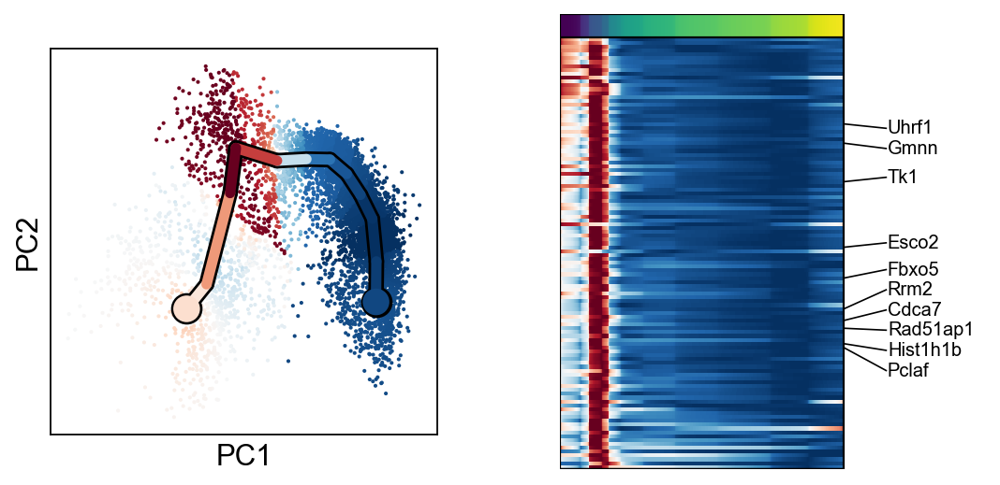

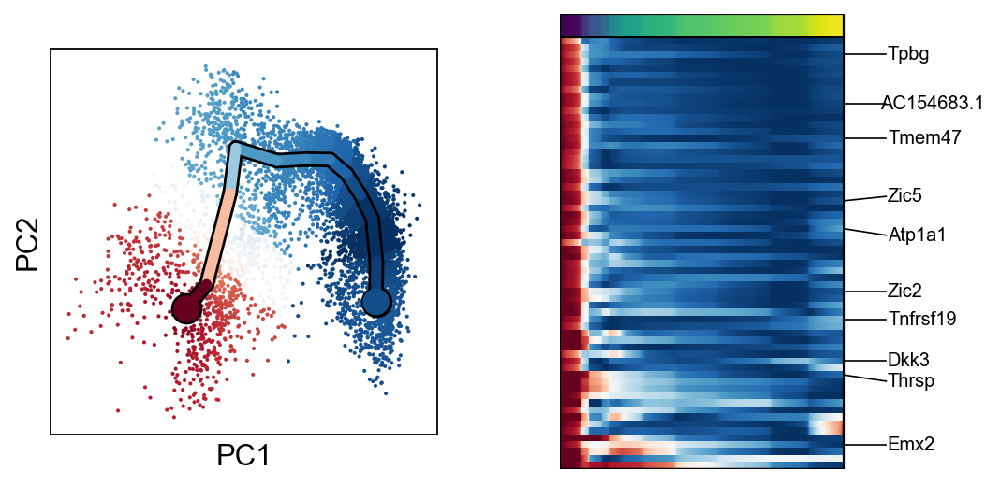

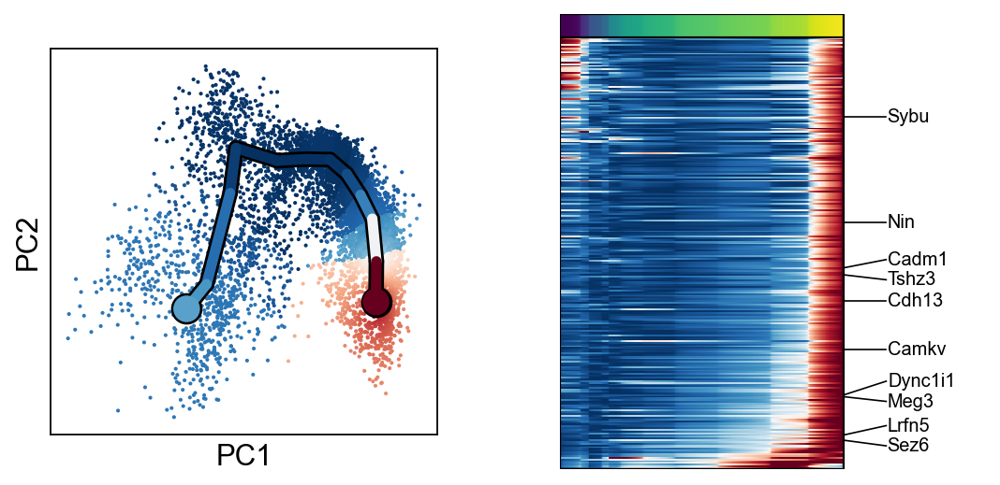

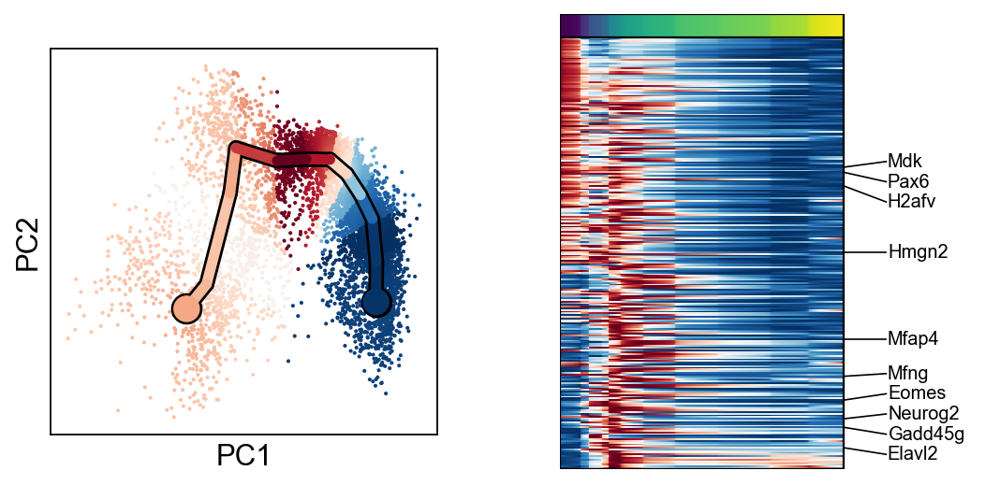

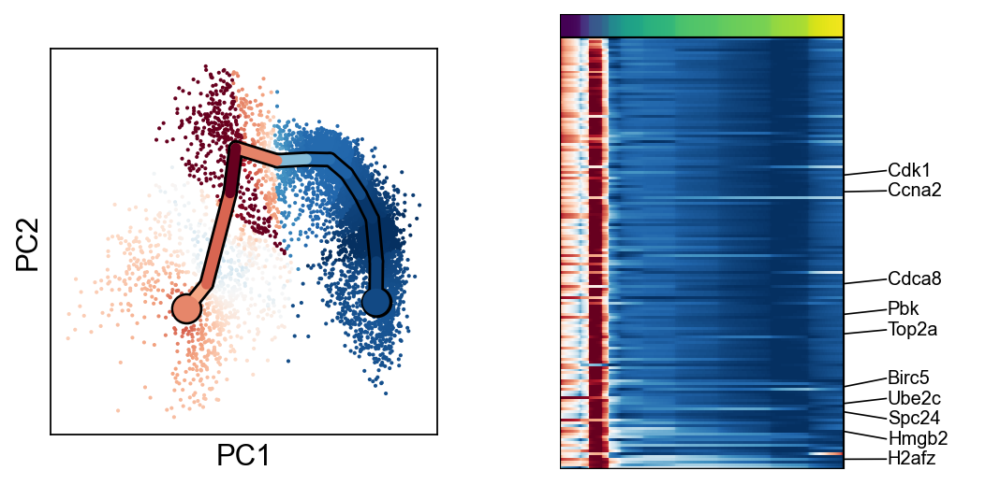

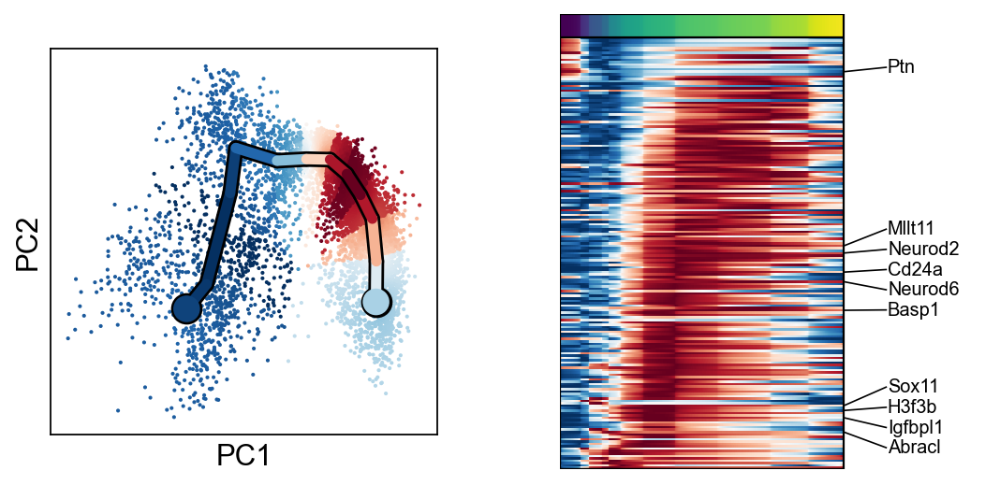

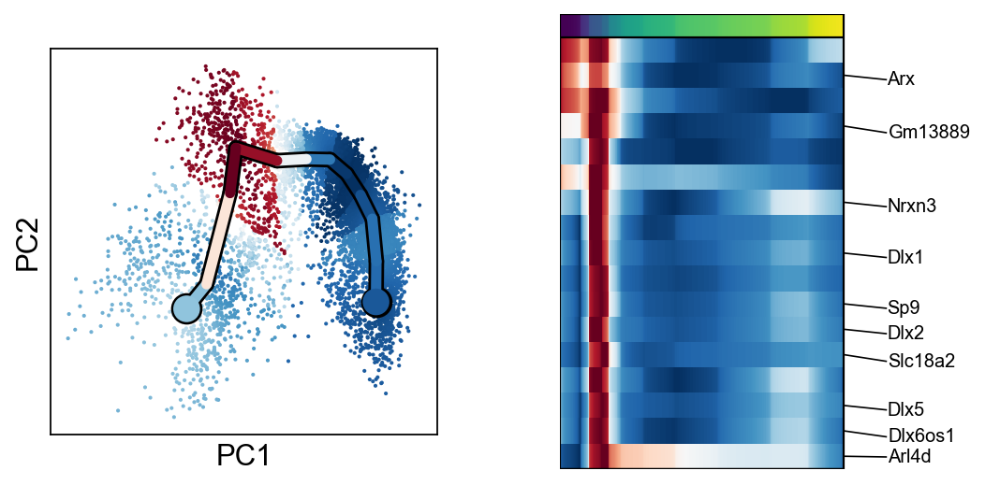

In [199]:
for c in adata_ex.var["clusters"].unique():
    scf.pl.trends(adata_ex,features=adata_ex.var_names[adata_ex.var.clusters==c],basis="pca")

